In [36]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [37]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [38]:
# Read in a image from torchvision
import torchvision
img = torchvision.io.read_image("/kaggle/input/horse-image/WhatsApp Image 2024-09-16 at 02.49.54.jpeg") # image is in the same folder as this file.
print(img.shape)

torch.Size([3, 698, 1280])


In [39]:
# Make grayscale
img = torch.tensor(img, dtype=torch.float)
img = img.mean(dim=0, keepdim=False)
print(img.shape)

torch.Size([698, 1280])


/tmp/ipykernel_37/232810751.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img = torch.tensor(img, dtype=torch.float)


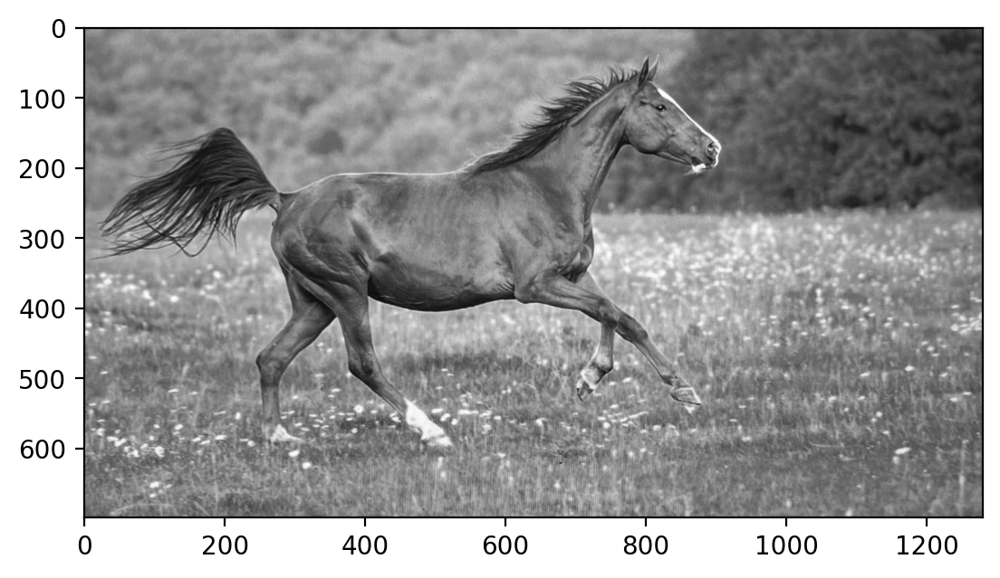

In [40]:
plt.imshow(img, cmap='gray')

In [41]:
crop = torchvision.transforms.functional.crop(img, 0, 700, 300, 300) #(img, starting y coordinate, starting x coordiante, size in x, size in y)
crop.shape


torch.Size([300, 300])

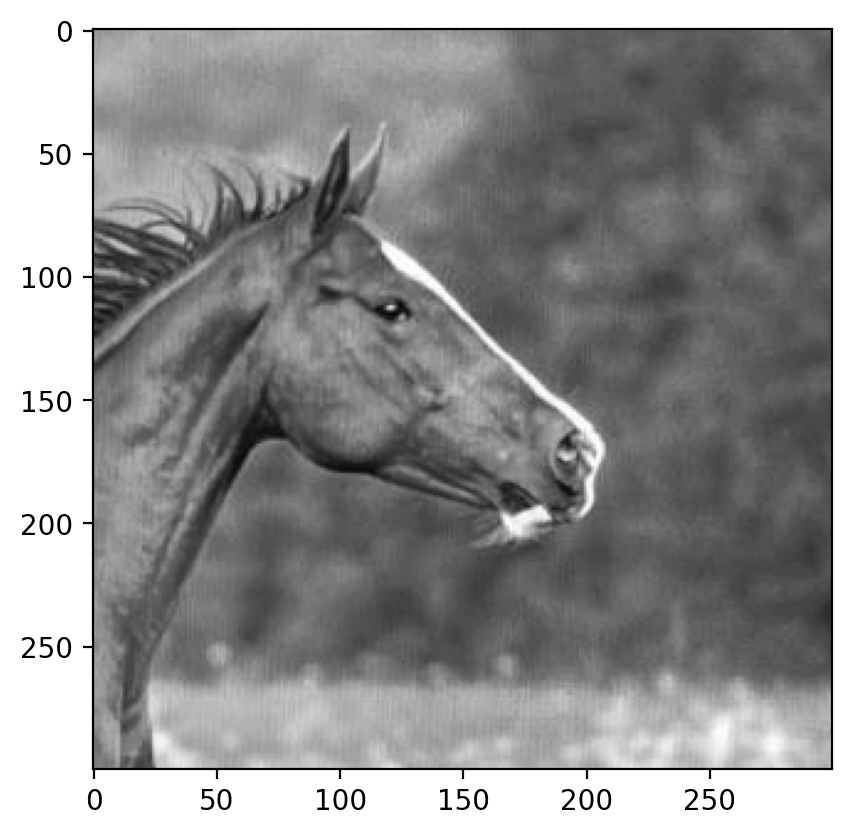

In [42]:
plt.imshow(crop, cmap='gray')

In [43]:
def factorize(A, r, device=torch.device("cpu")):
    """Factorize the matrix A into W and H
    A: input matrix of size (n_users, n_movies)
    k: number of latent features
    
    Returns W and H
    W: matrix of size (n_users, k)
    H: matrix of size (k, n_movies)
    """
    A = A.to(device)
    # Randomly initialize W and H
    W = torch.randn(A.shape[0], r, requires_grad=True, device=device)
    H = torch.randn(r, A.shape[1], requires_grad=True, device=device)
    
    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    
    mask = ~torch.isnan(A) 

    current_loss = 0
    prev_loss = 0
    no_epochs = 0

    # Train the model
    for i in range(5001):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Backpropagate
        loss.backward()
        
        # Update the parameters
        optimizer.step()

        # Stopping condition
        prev_loss = current_loss
        current_loss = loss.item()

        if abs(current_loss - prev_loss) < 0.0001:
            break

        no_epochs += 1
    
    # Printing loss after certain epochs:
    print("Loss:", loss.item())
    print("Number of epochs", no_epochs)
    print("Number of Features:", r)
    
    # Printing RMSE and PSNR:
    diff_matrix = A - torch.mm(W, H)
    diff_vector = diff_matrix[mask]
    mse = torch.mean(diff_vector ** 2)
    rmse = torch.sqrt(mse)
    print("Root Mean Squared Error:", rmse.item())

    psnr = 10 * torch.log10(255**2 / mse)
    print("Peak Signal to Noise Ratio:", psnr.item())

    # Showing the reconstructed and orignal image:
    plt.subplot(1,2, 1)
    plt.imshow(torch.mm(W, H).cpu().detach().numpy(), cmap='gray', )
    plt.title("Reconstructed Image")
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(A, cmap='gray')
    plt.title("Orignal Image")
    plt.axis('off')
    plt.show()
        
    return rmse.item(), psnr.item(), loss.item() # will be using these in graph plotting 

Loss: 37846.84765625
Number of epochs 1
Number of Features: 0
Root Mean Squared Error: 126.15668487548828
Peak Signal to Noise Ratio: 6.112598419189453


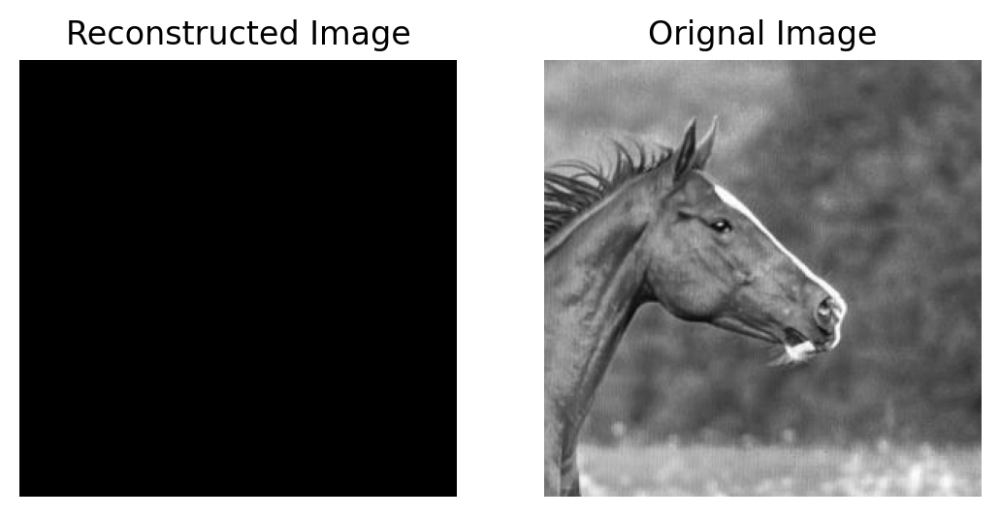

Loss: 2672.2861328125
Number of epochs 3348
Number of Features: 20
Root Mean Squared Error: 8.907620429992676
Peak Signal to Noise Ratio: 29.135570526123047


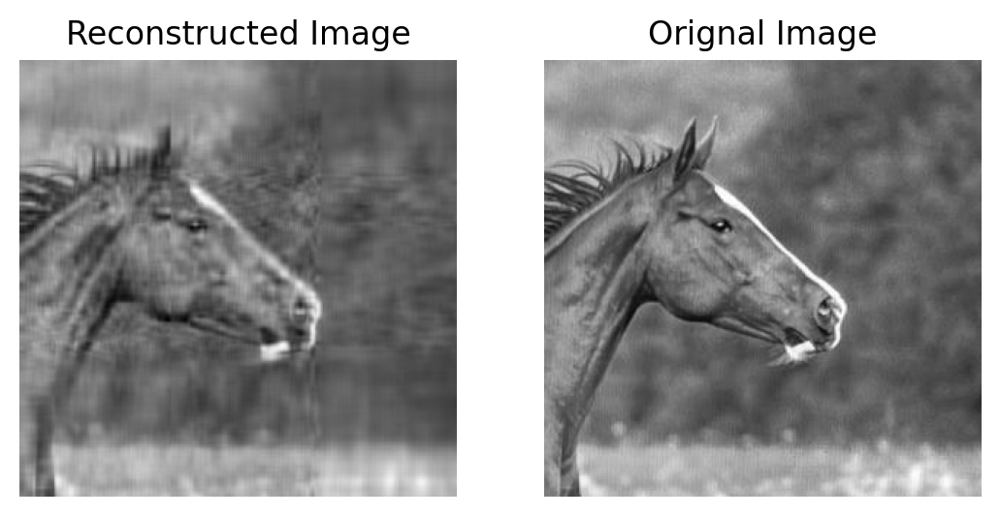

Loss: 1419.0748291015625
Number of epochs 2916
Number of Features: 40
Root Mean Squared Error: 4.730249404907227
Peak Signal to Noise Ratio: 34.633121490478516


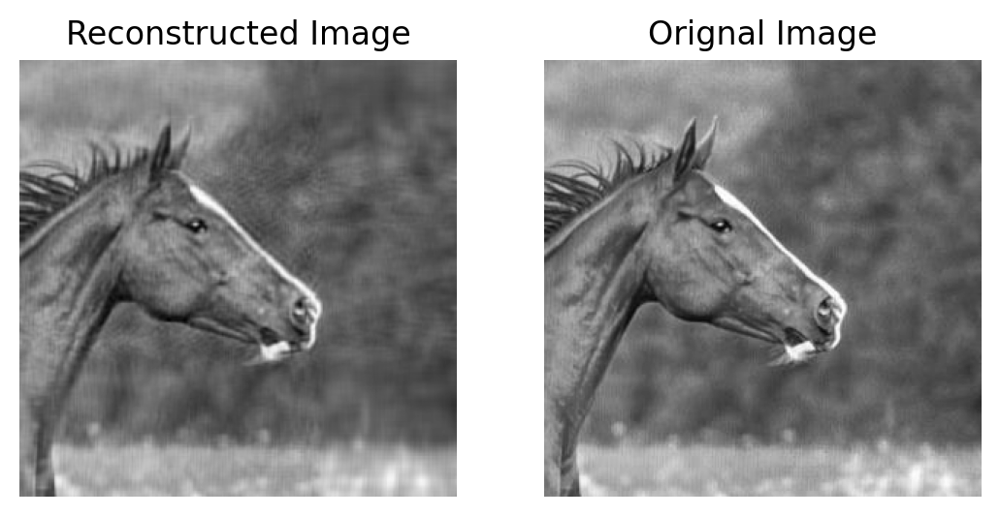

Loss: 840.004150390625
Number of epochs 2334
Number of Features: 60
Root Mean Squared Error: 2.8000099658966064
Peak Signal to Noise Ratio: 39.18761444091797


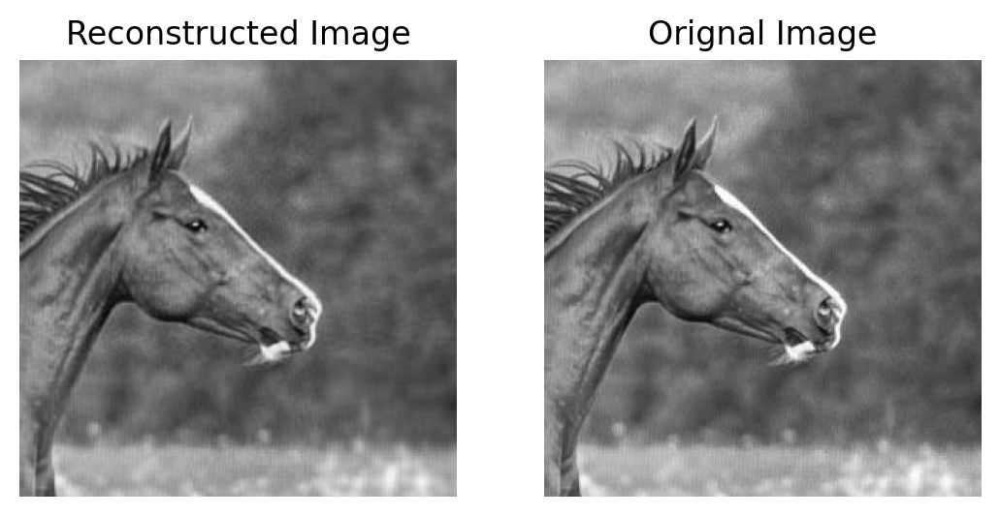

Loss: 536.7459716796875
Number of epochs 2447
Number of Features: 80
Root Mean Squared Error: 1.7891515493392944
Peak Signal to Noise Ratio: 43.077857971191406


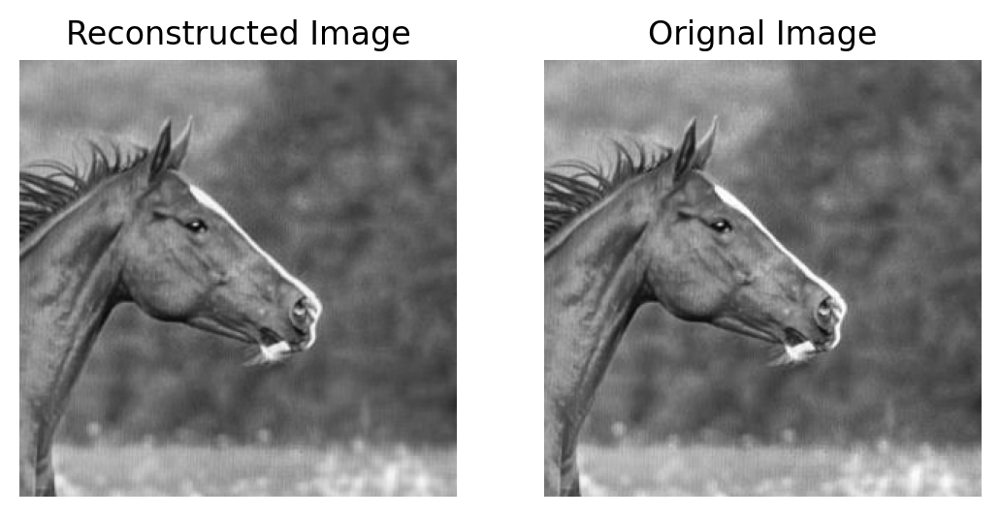

Loss: 359.6557922363281
Number of epochs 2488
Number of Features: 100
Root Mean Squared Error: 1.1988534927368164
Peak Signal to Noise Ratio: 46.55548095703125


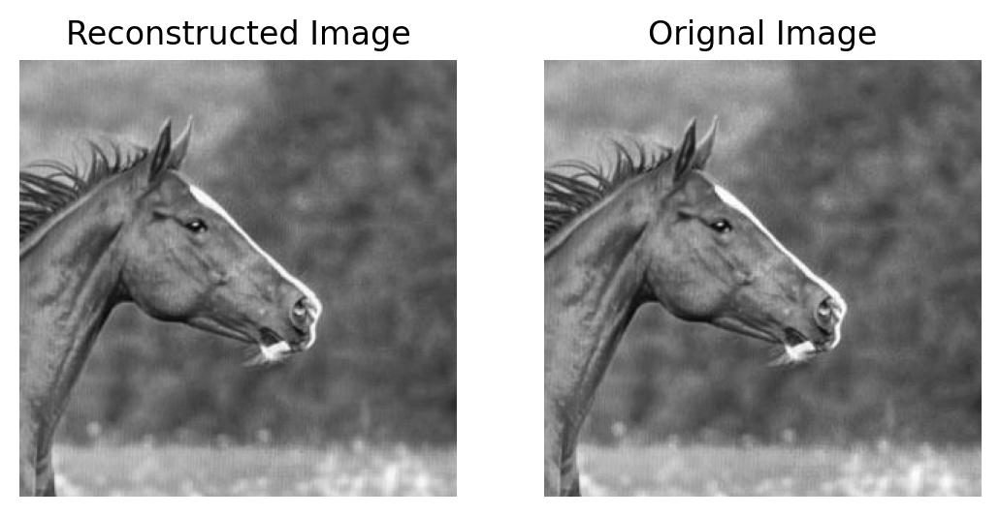

Loss: 238.8218231201172
Number of epochs 2110
Number of Features: 120
Root Mean Squared Error: 0.7960778474807739
Peak Signal to Noise Ratio: 50.1116943359375


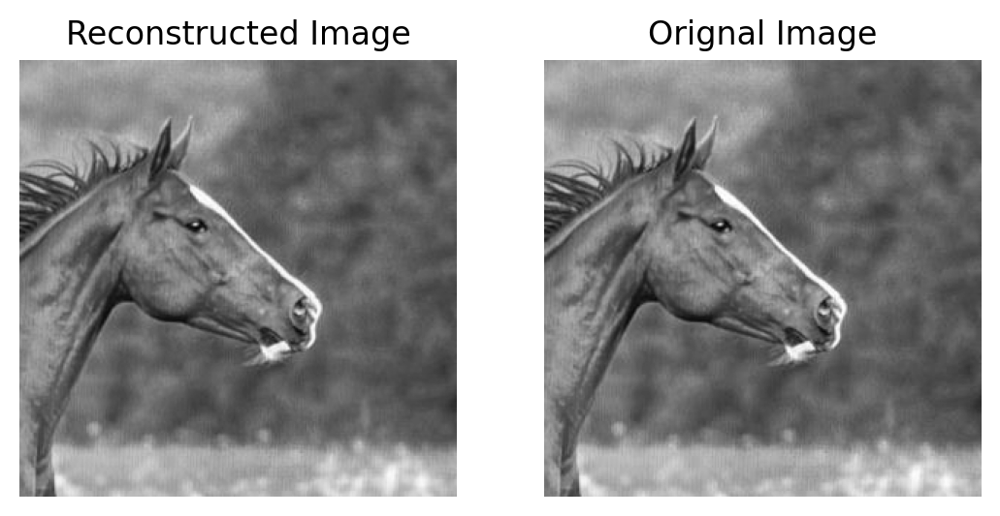

Loss: 156.5875244140625
Number of epochs 1863
Number of Features: 140
Root Mean Squared Error: 0.521964967250824
Peak Signal to Noise Ratio: 53.777976989746094


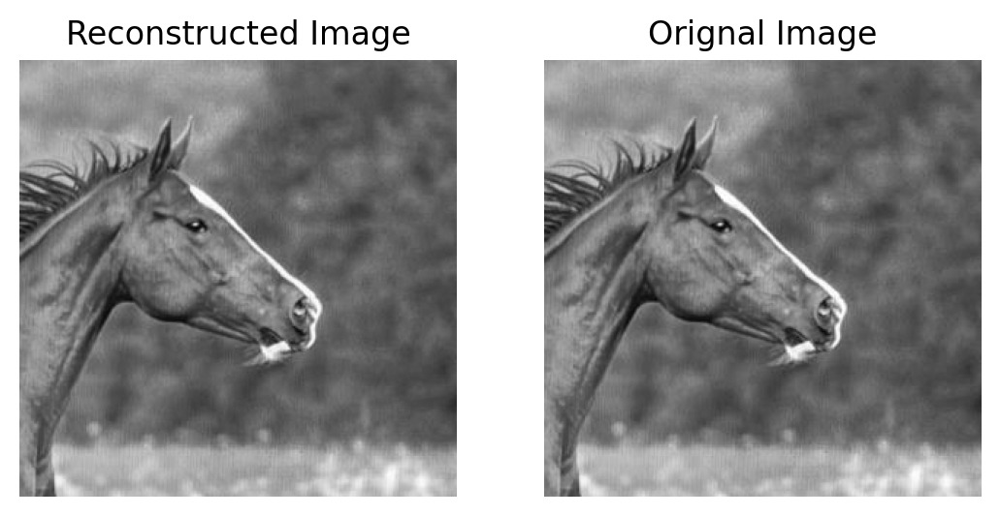

Loss: 96.92831420898438
Number of epochs 3349
Number of Features: 160
Root Mean Squared Error: 0.3230709731578827
Peak Signal to Noise Ratio: 57.944847106933594


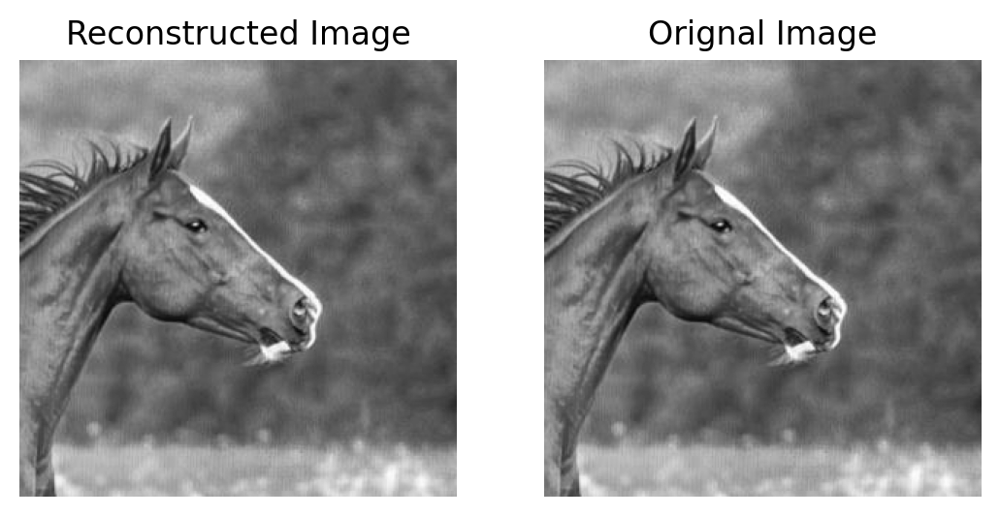

Loss: 72.90172576904297
Number of epochs 3016
Number of Features: 180
Root Mean Squared Error: 0.242958664894104
Peak Signal to Noise Ratio: 60.4201545715332


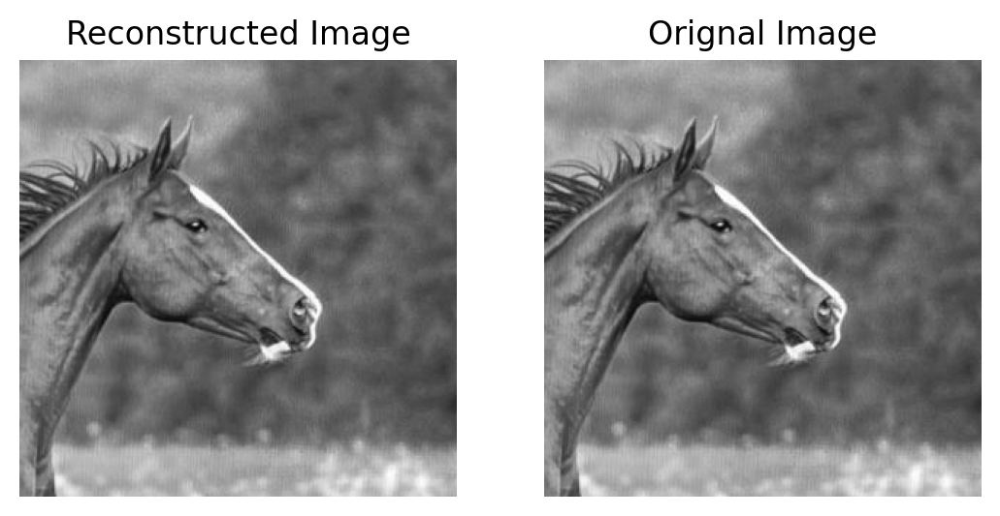

Loss: 67.2635726928711
Number of epochs 2341
Number of Features: 200
Root Mean Squared Error: 0.22413958609104156
Peak Signal to Noise Ratio: 61.12043380737305


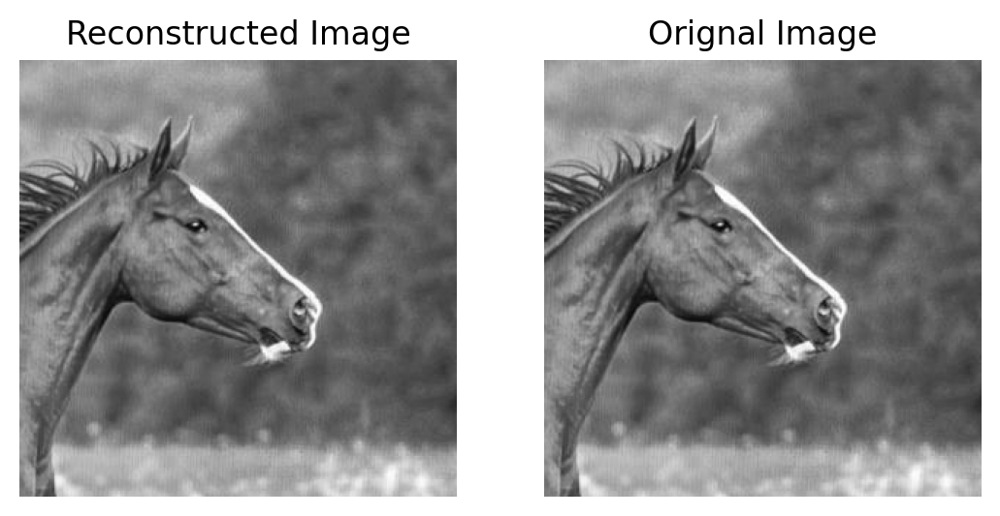

Loss: 64.8868637084961
Number of epochs 1864
Number of Features: 220
Root Mean Squared Error: 0.21618536114692688
Peak Signal to Noise Ratio: 61.43428039550781


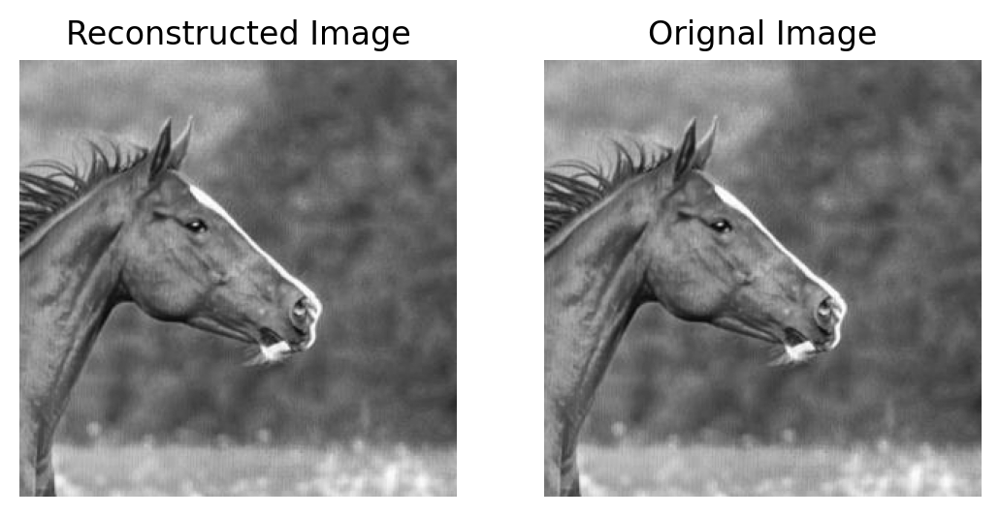

Loss: 63.952171325683594
Number of epochs 1530
Number of Features: 240
Root Mean Squared Error: 0.21302983164787292
Peak Signal to Noise Ratio: 61.56199645996094


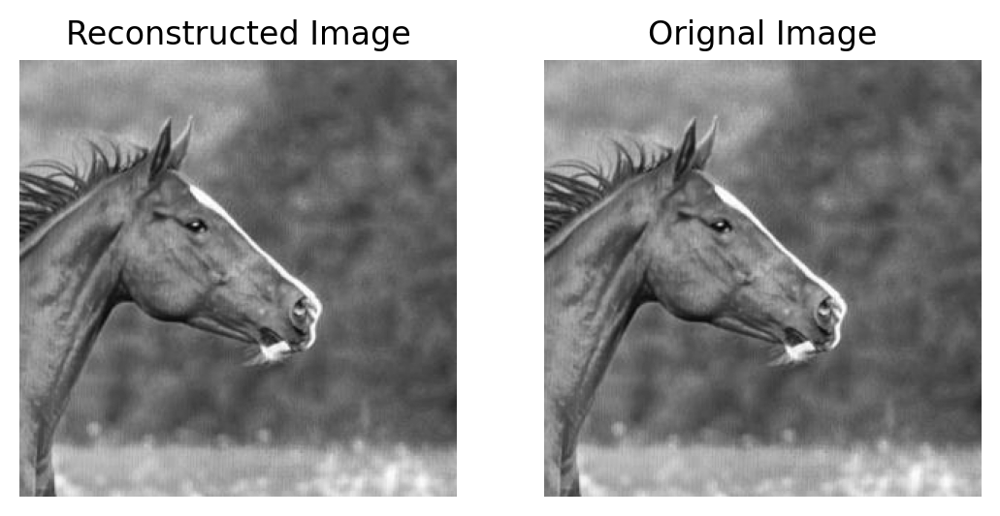

Loss: 39.661041259765625
Number of epochs 5001
Number of Features: 260
Root Mean Squared Error: 0.13207468390464783
Peak Signal to Noise Ratio: 65.71440887451172


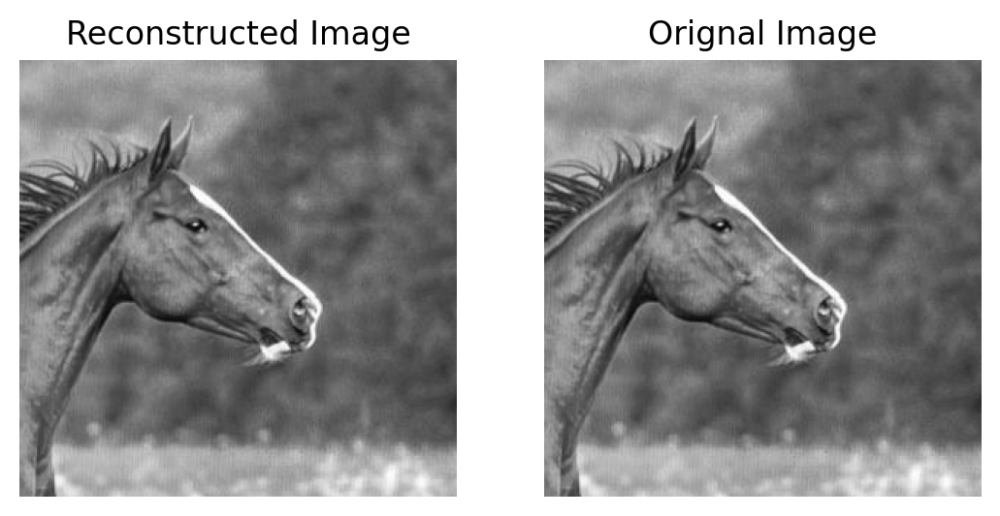

Loss: 64.57268524169922
Number of epochs 1070
Number of Features: 280
Root Mean Squared Error: 0.21498912572860718
Peak Signal to Noise Ratio: 61.48247146606445


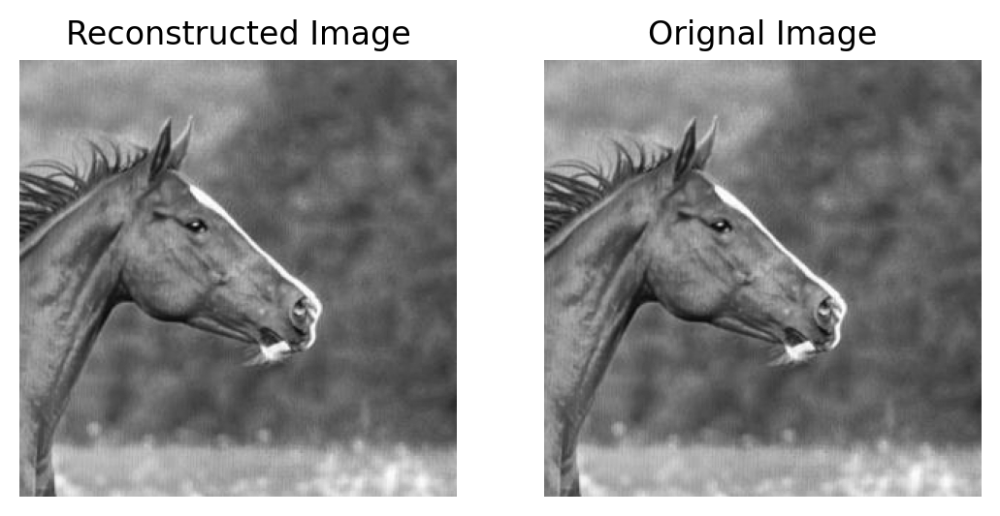

Loss: 35.229827880859375
Number of epochs 5001
Number of Features: 300
Root Mean Squared Error: 0.11709588021039963
Peak Signal to Noise Ratio: 66.75997161865234


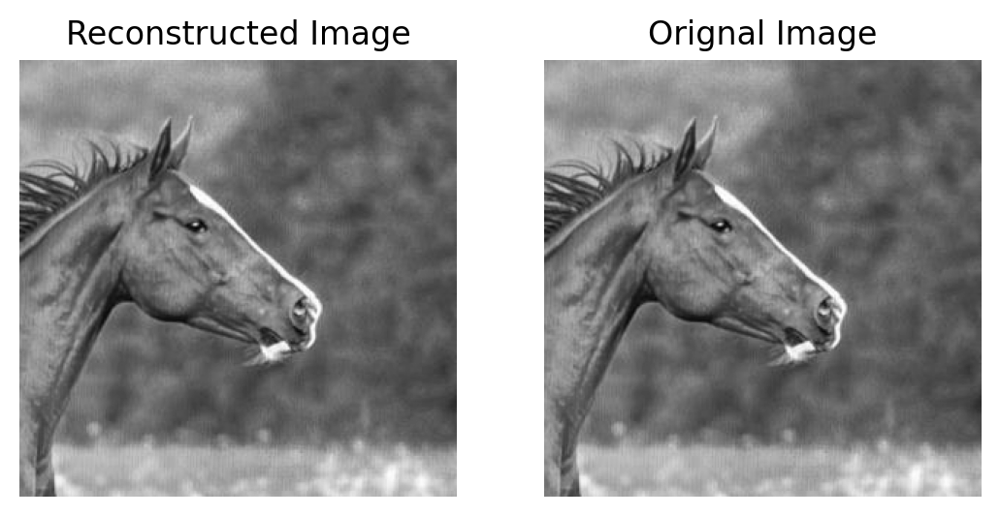

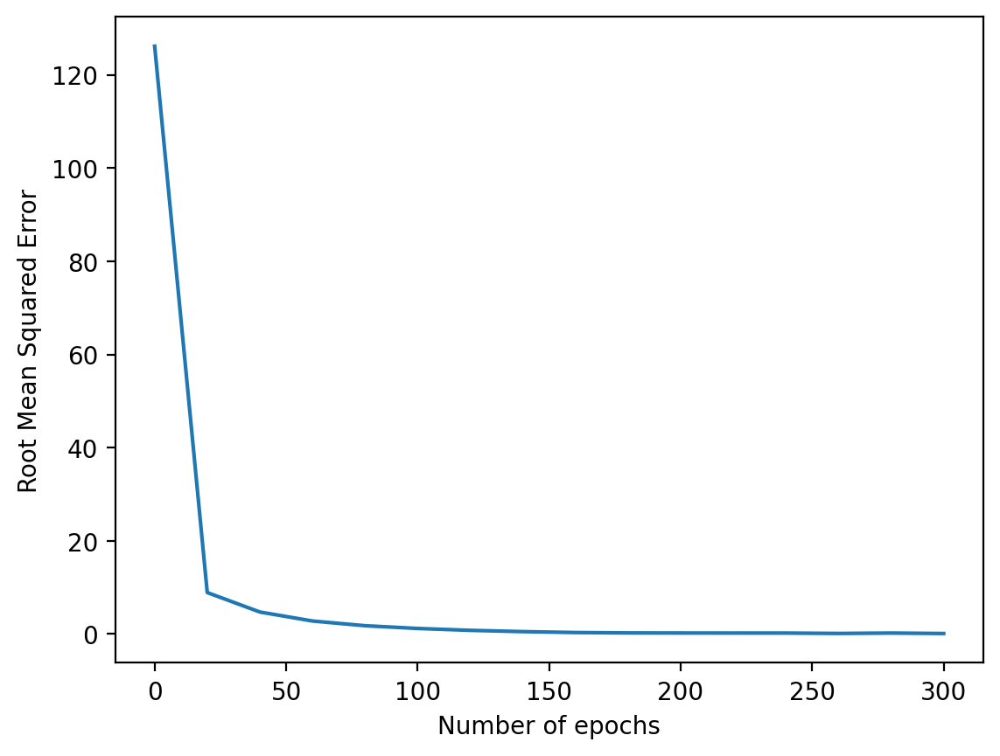

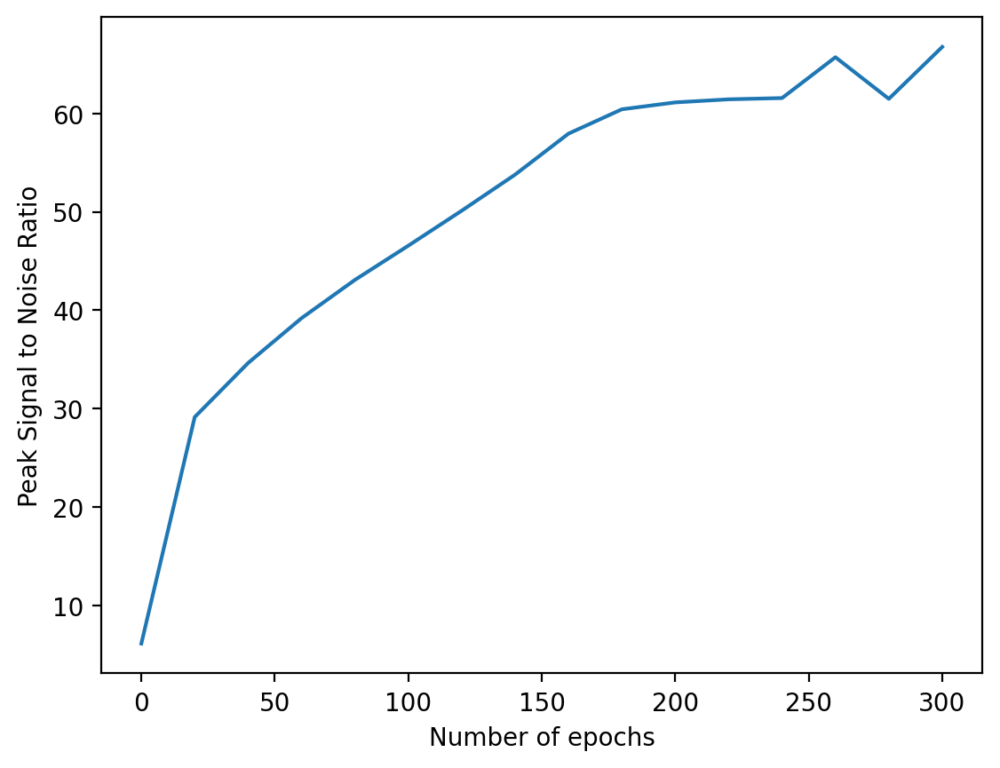

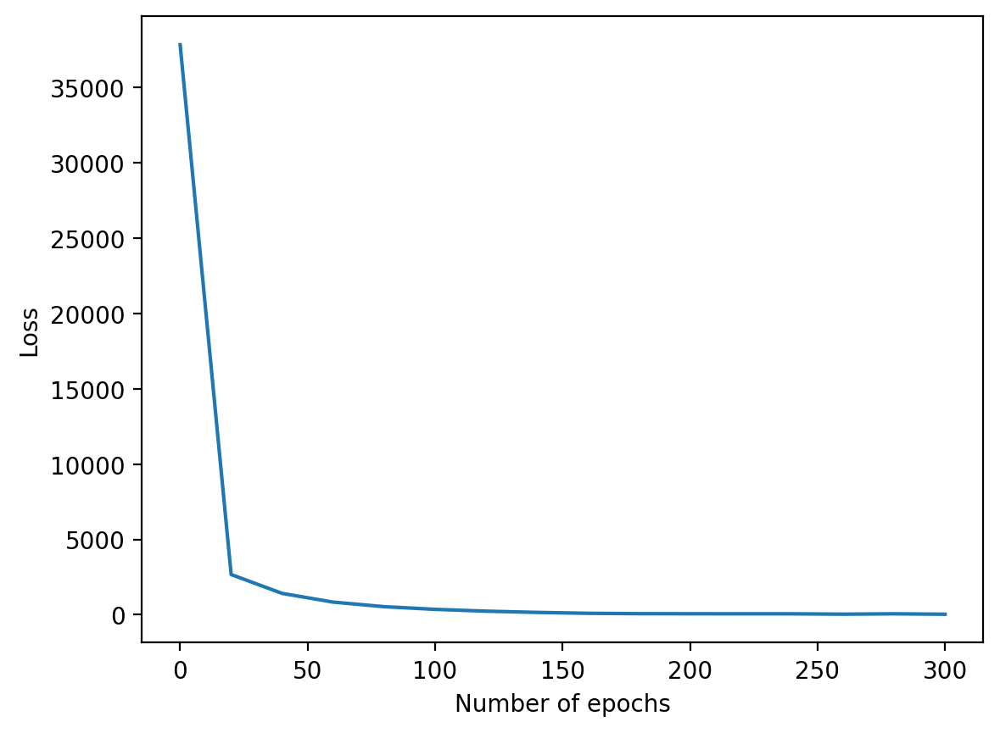

In [44]:
# Plotting and getting the results
no_features = []
rmse_l = []
psnr_l = []
loss = []
for r in range(0, 301, 20): # taking features form 0 to 301 as taking more features will just result in more overfitting.
    a, b, c= factorize(crop, r)
    rmse_l.append(a)
    psnr_l.append(b)
    loss.append(c)
    no_features.append(r)

plt.plot(no_features, rmse_l)
plt.xlabel("Number of epochs")
plt.ylabel("Root Mean Squared Error")
plt.show()
plt.plot(no_features, psnr_l)
plt.xlabel("Number of epochs")
plt.ylabel("Peak Signal to Noise Ratio")
plt.show()
plt.plot(no_features, loss)
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.show()

##### 2. Consider a case where 900 pixels (30x30) are randomly missing from an image. Reconstruct the image using matrix factorization, plot the reconstructed image, and calculate the RMSE and PSNR metrics. Next, reconstruct the same image with the missing pixels using Random Fourier Features (RFF) and Linear Regression. Compute the RMSE and PSNR for both methods, and compare the results to see which performs better.[3 Marks]

In [45]:
# Masking the image with NaN values for a patch

def mask_image_patch(img):
    img_copy = img.clone()
    mask = ~(img >= 0)
    a = [i for i in range(200, 230)]
    b = [i for i in range(135, 165)]
    for i in range(1, mask.shape[0]):
        for j in range(1, mask.shape[1]):
            if i in a and j in b:
                mask[i][j] = True
    img_copy[mask] = float("nan")
    return img_copy, mask
    
masked_img_patch = mask_image_patch(crop) # exactly 900 pixels can be removed
masked_img_patch[1].sum()

tensor(900)

Loss: 37743.8359375
Number of epochs 1
Number of Features: 0
Root Mean Squared Error: 126.44713592529297
Peak Signal to Noise Ratio: 6.092624187469482


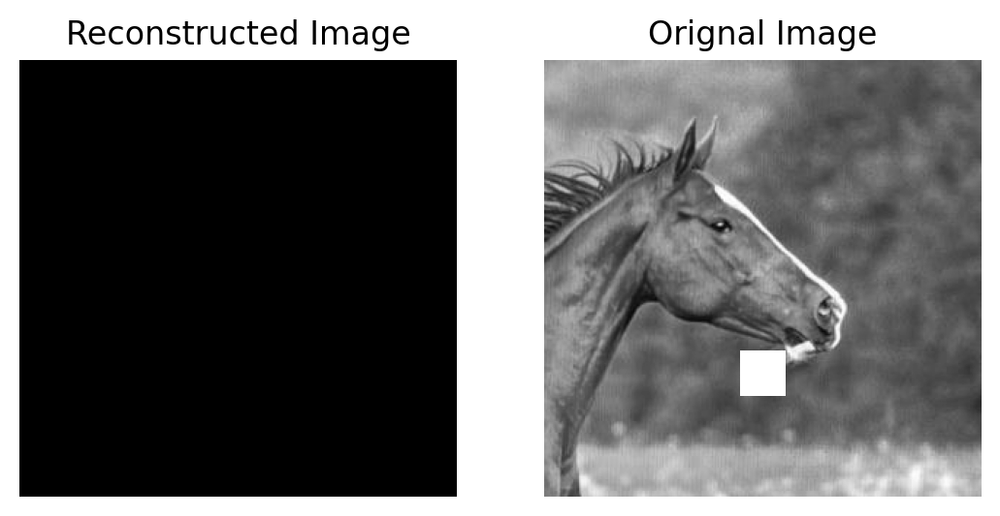

Loss: 2651.722900390625
Number of epochs 3767
Number of Features: 20
Root Mean Squared Error: 8.883600234985352
Peak Signal to Noise Ratio: 29.15902328491211


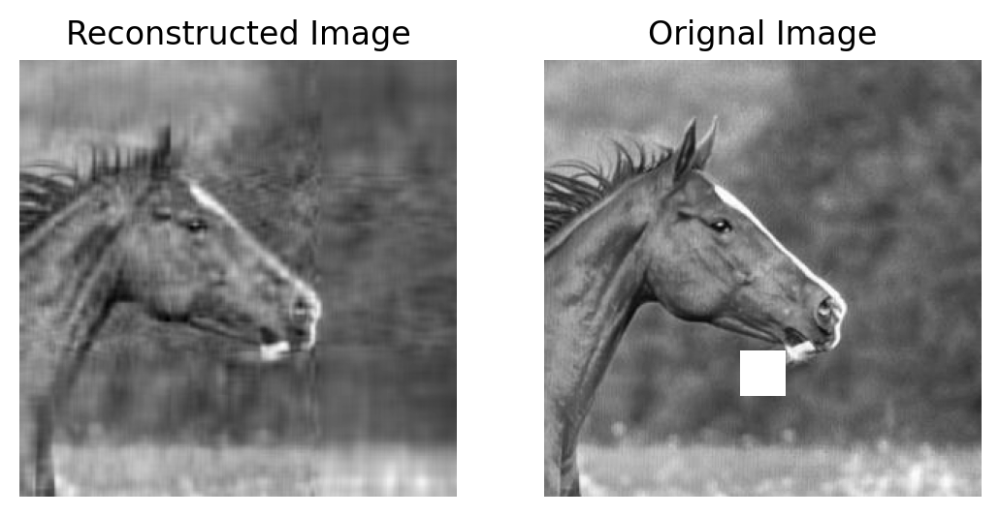

Loss: 1388.642333984375
Number of epochs 3880
Number of Features: 40
Root Mean Squared Error: 4.652122974395752
Peak Signal to Noise Ratio: 34.77777862548828


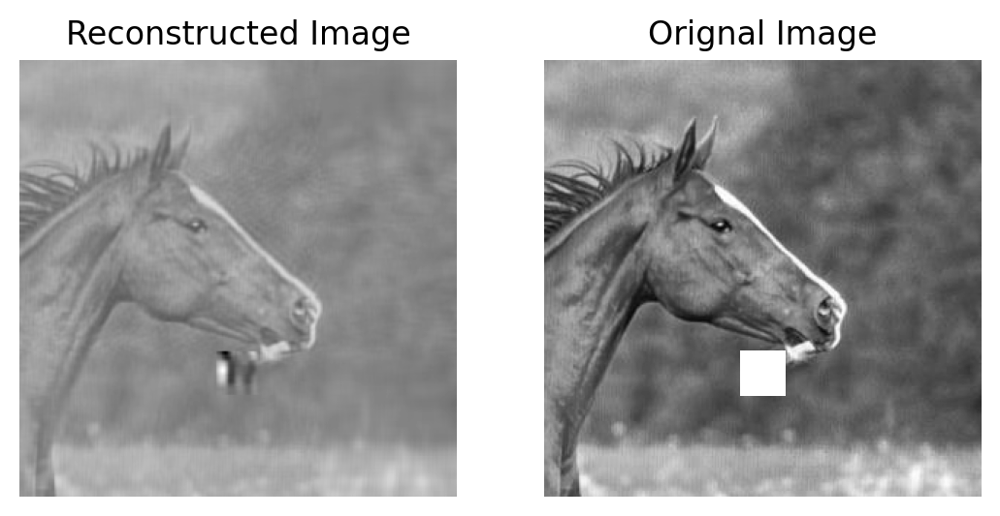

Loss: 817.2940063476562
Number of epochs 4281
Number of Features: 60
Root Mean Squared Error: 2.738041639328003
Peak Signal to Noise Ratio: 39.38200378417969


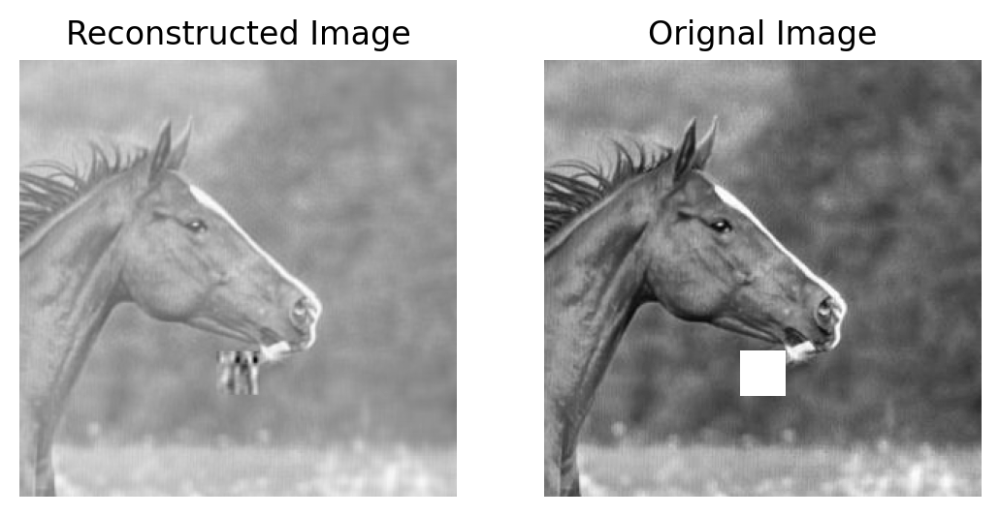

Loss: 517.6436767578125
Number of epochs 3094
Number of Features: 80
Root Mean Squared Error: 1.734179973602295
Peak Signal to Noise Ratio: 43.34892272949219


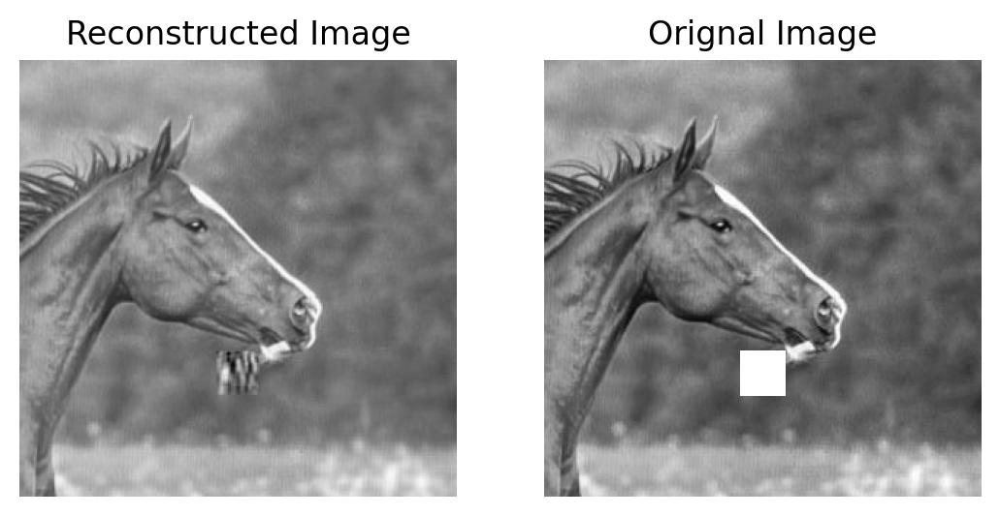

Loss: 344.8846740722656
Number of epochs 2298
Number of Features: 100
Root Mean Squared Error: 1.1554100513458252
Peak Signal to Noise Ratio: 46.87608337402344


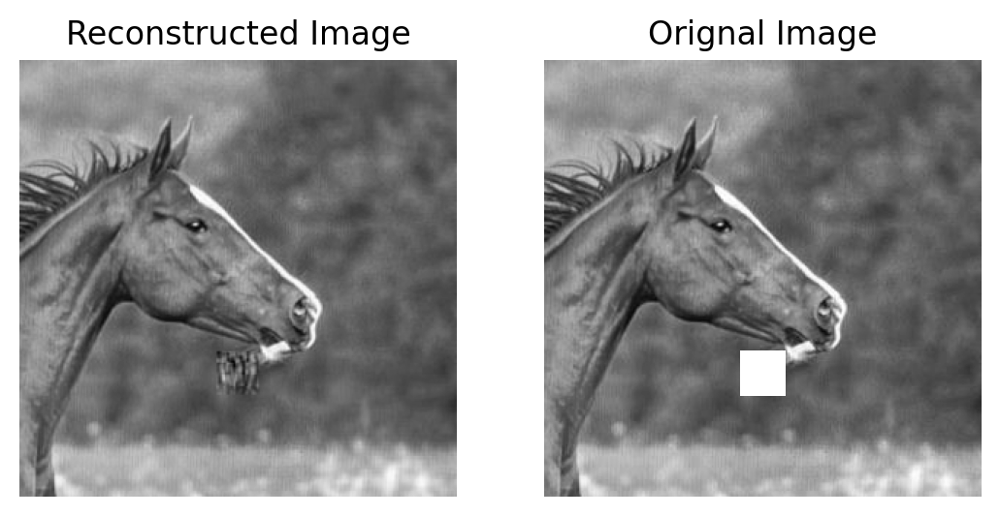

Loss: 230.5780487060547
Number of epochs 1669
Number of Features: 120
Root Mean Squared Error: 0.7724930644035339
Peak Signal to Noise Ratio: 50.37290954589844


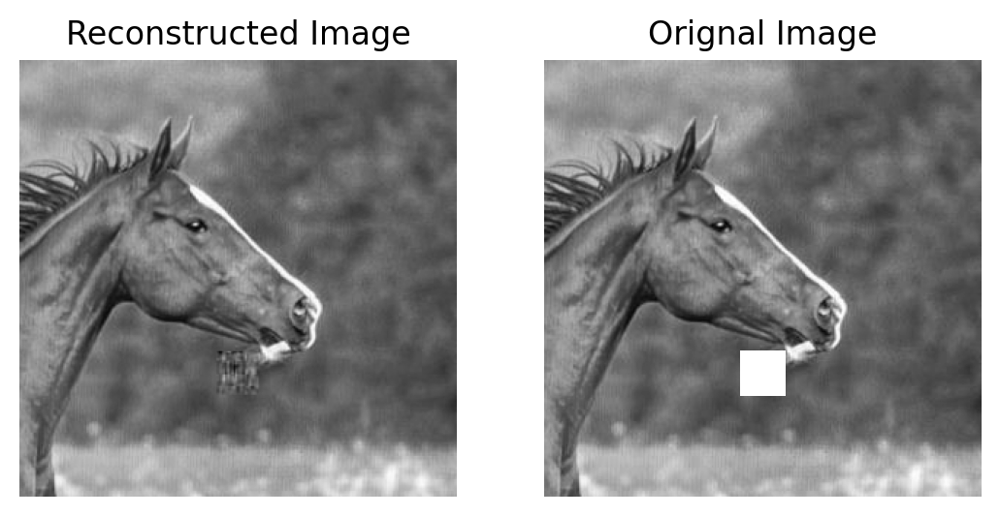

Loss: 140.744384765625
Number of epochs 3456
Number of Features: 140
Root Mean Squared Error: 0.4714990556240082
Peak Signal to Noise Ratio: 54.66118621826172


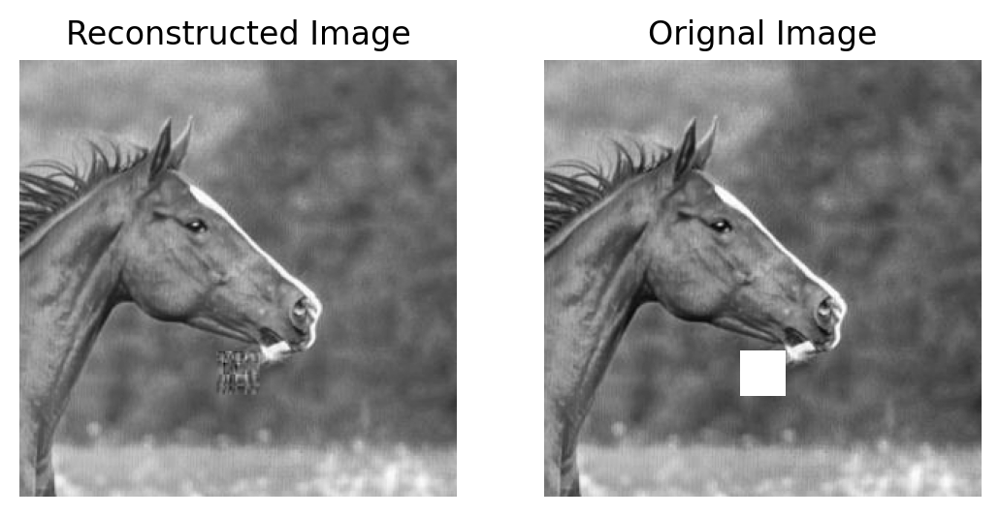

Loss: 90.35394287109375
Number of epochs 3508
Number of Features: 160
Root Mean Squared Error: 0.30267050862312317
Peak Signal to Noise Ratio: 58.51139831542969


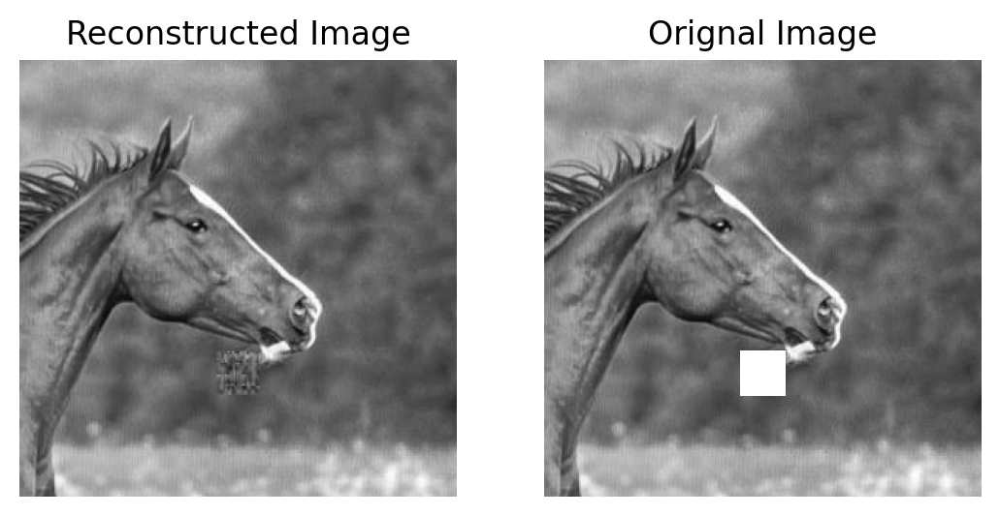

Loss: 70.87165832519531
Number of epochs 2997
Number of Features: 180
Root Mean Squared Error: 0.23737911880016327
Peak Signal to Noise Ratio: 60.621952056884766


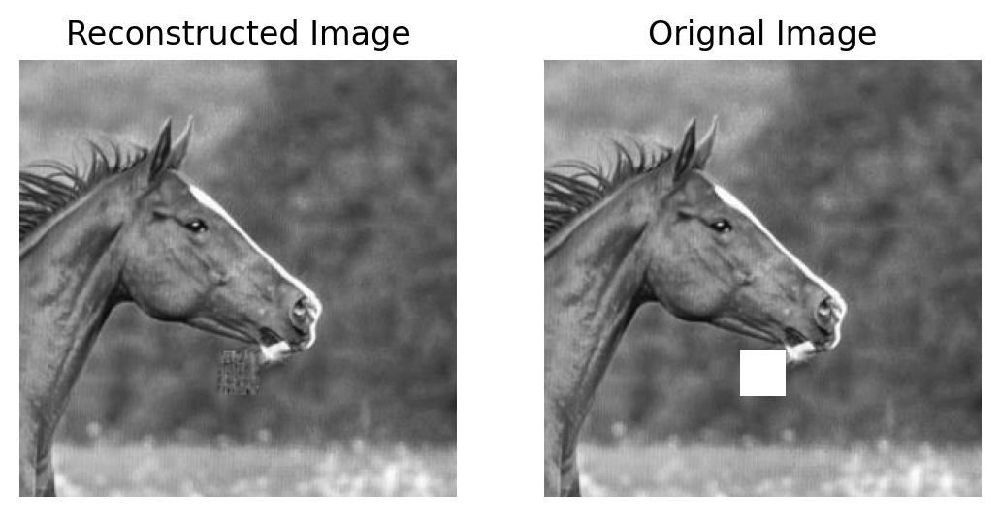

Loss: 66.57200622558594
Number of epochs 2368
Number of Features: 200
Root Mean Squared Error: 0.22295092046260834
Peak Signal to Noise Ratio: 61.1666145324707


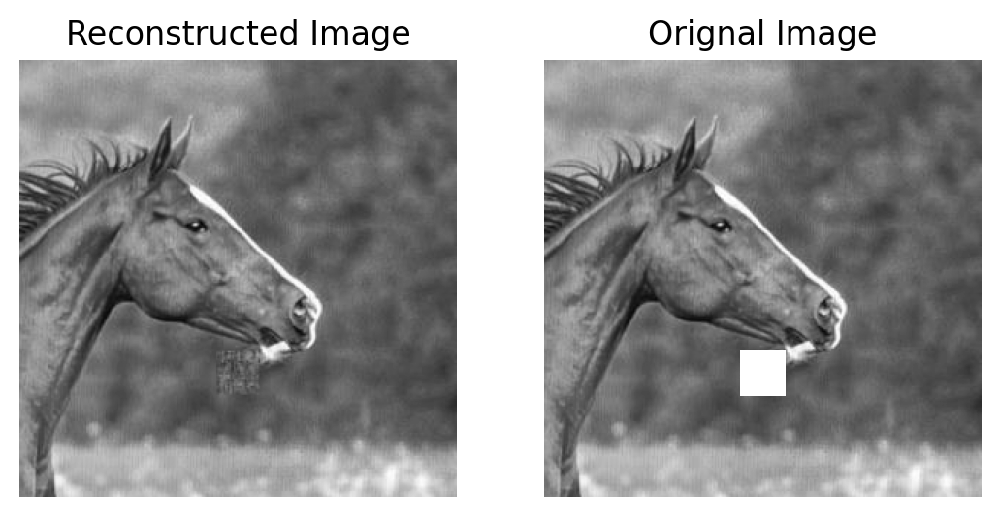

Loss: 63.64289474487305
Number of epochs 1840
Number of Features: 220
Root Mean Squared Error: 0.2131016105413437
Peak Signal to Noise Ratio: 61.55906677246094


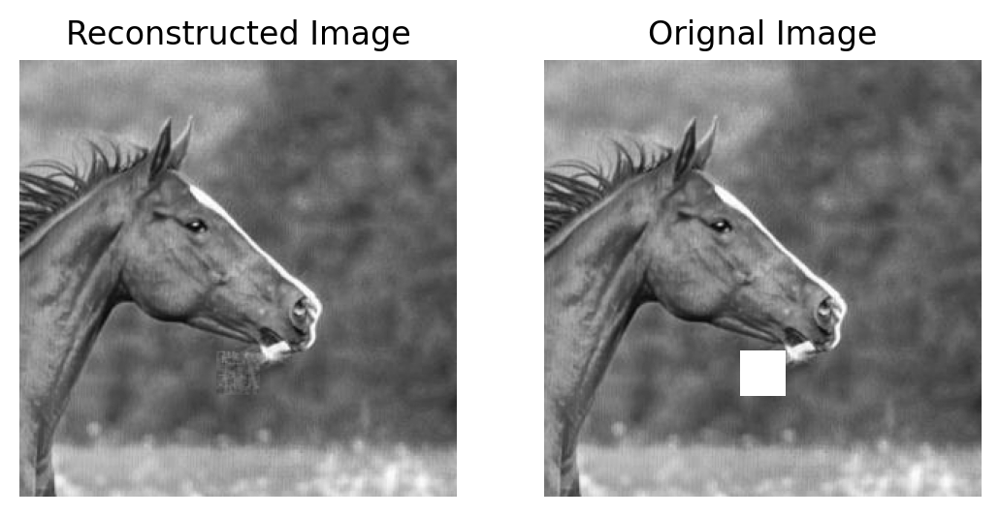

Loss: 63.2781867980957
Number of epochs 1478
Number of Features: 240
Root Mean Squared Error: 0.2118435949087143
Peak Signal to Noise Ratio: 61.610496520996094


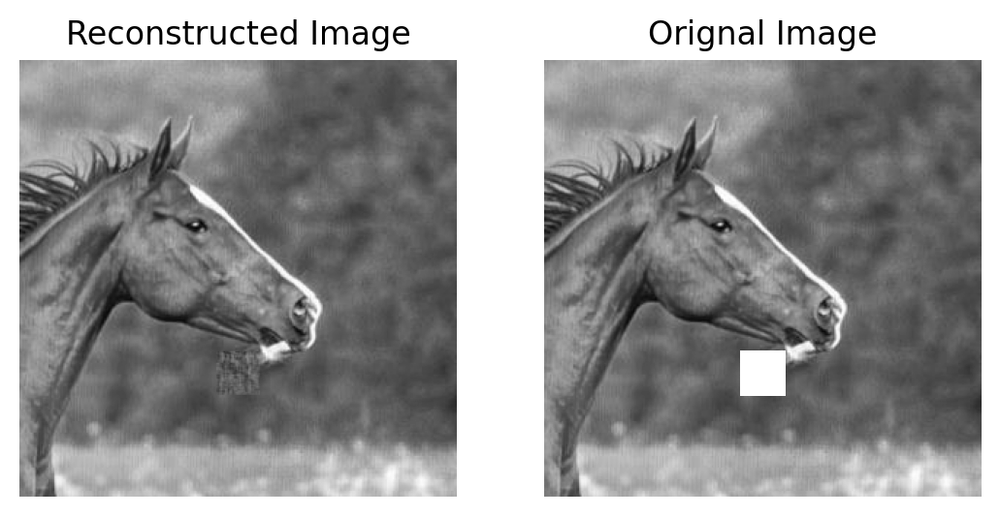

Loss: 62.96249008178711
Number of epochs 1219
Number of Features: 260
Root Mean Squared Error: 0.21072405576705933
Peak Signal to Noise Ratio: 61.656524658203125


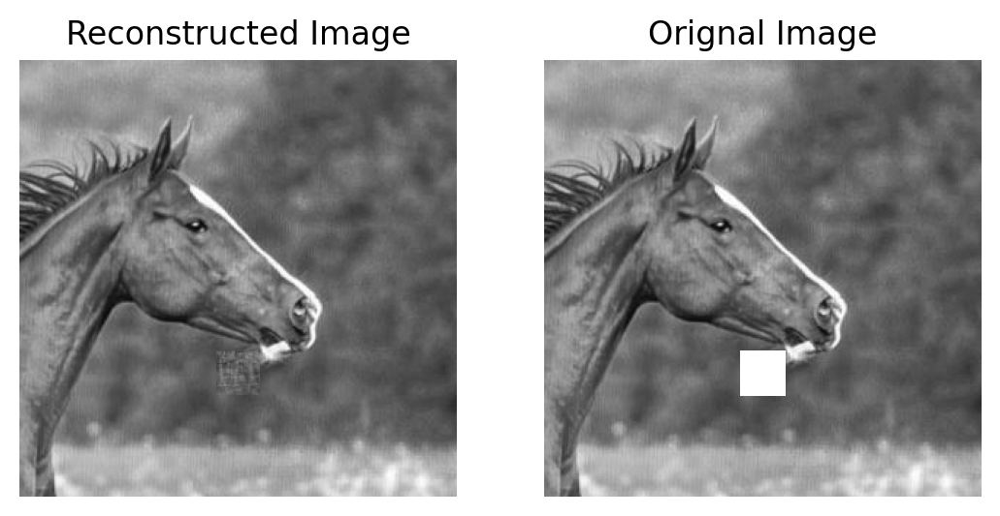

Loss: 63.5535774230957
Number of epochs 1011
Number of Features: 280
Root Mean Squared Error: 0.2126382291316986
Peak Signal to Noise Ratio: 61.577980041503906


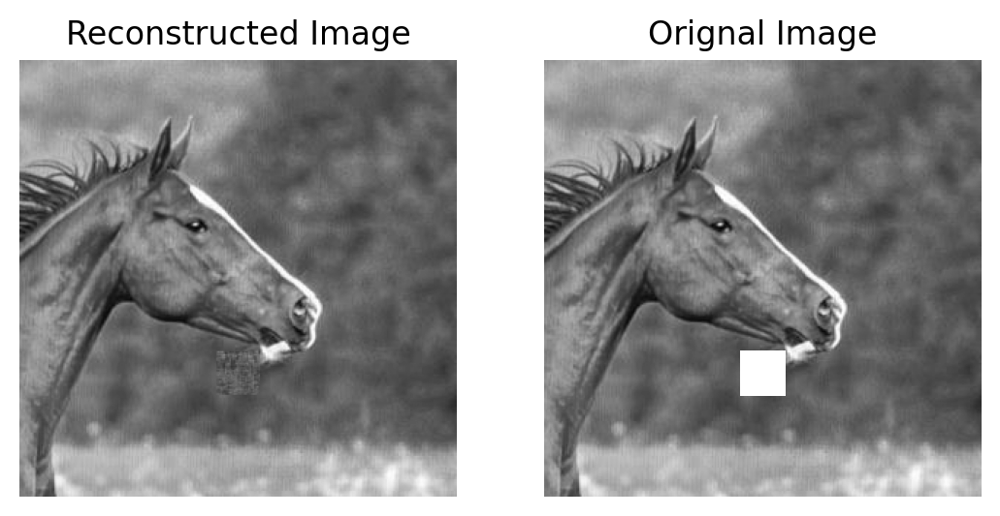

Loss: 64.93510437011719
Number of epochs 880
Number of Features: 300
Root Mean Squared Error: 0.21717707812786102
Peak Signal to Noise Ratio: 61.39452362060547


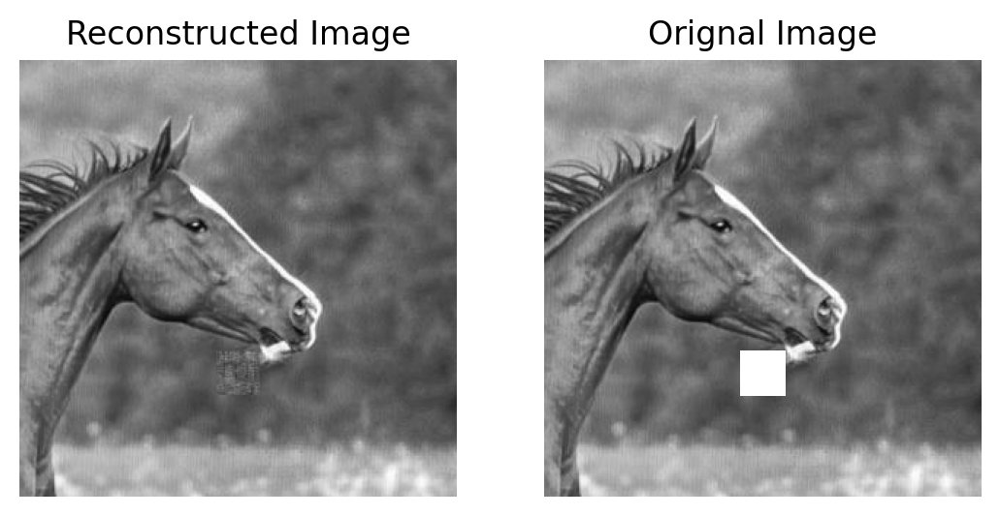

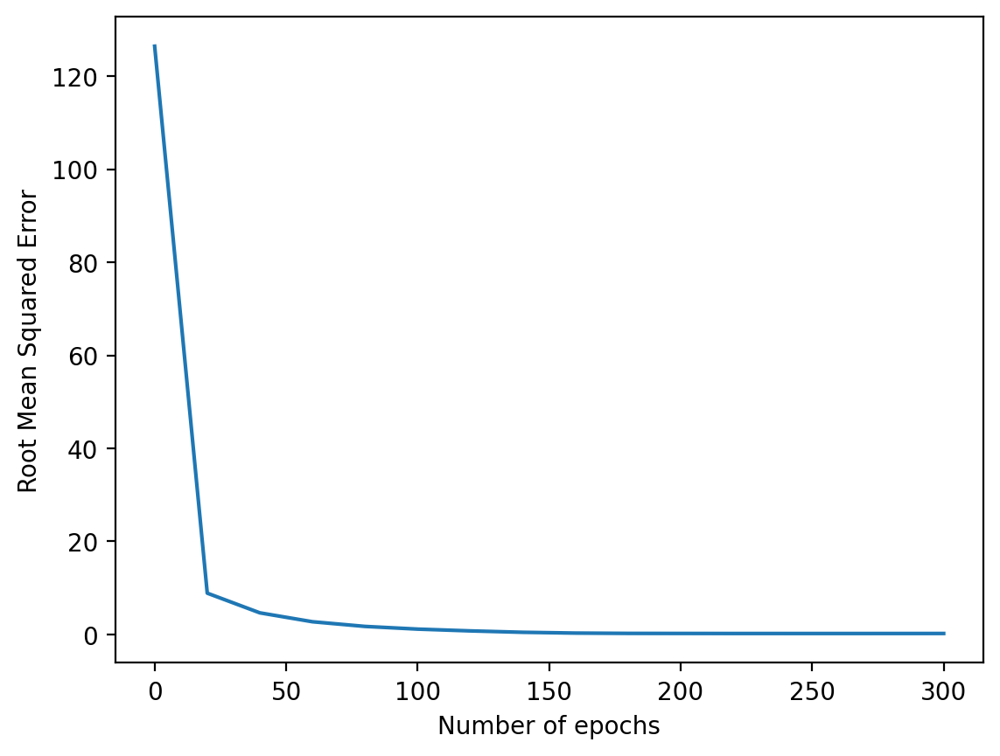

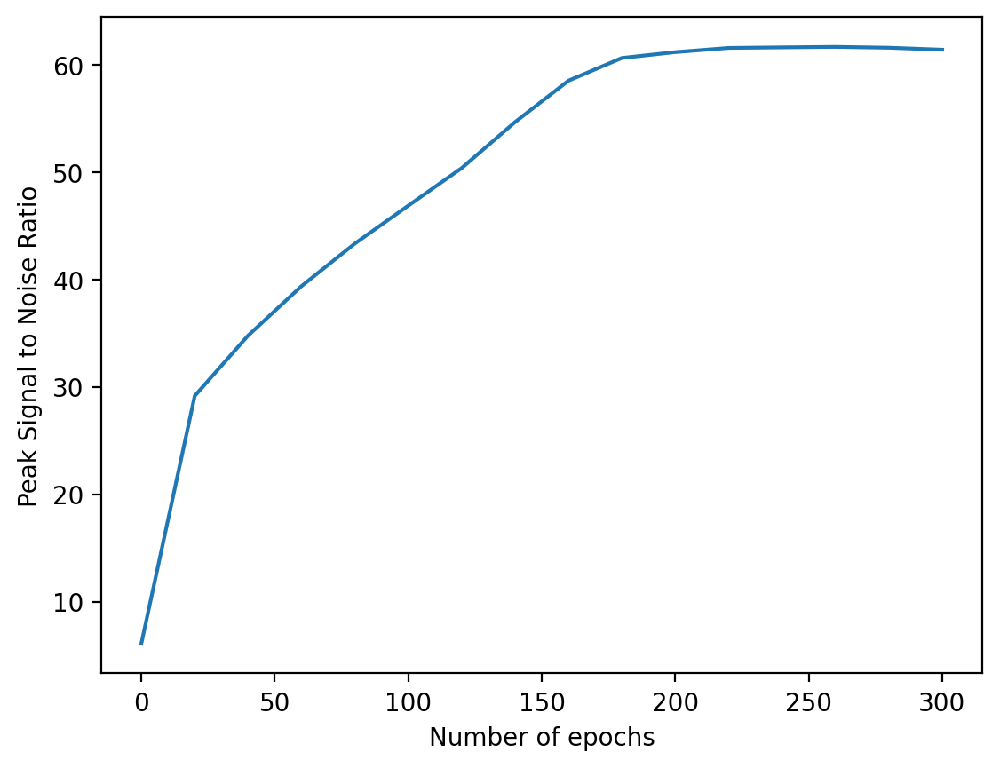

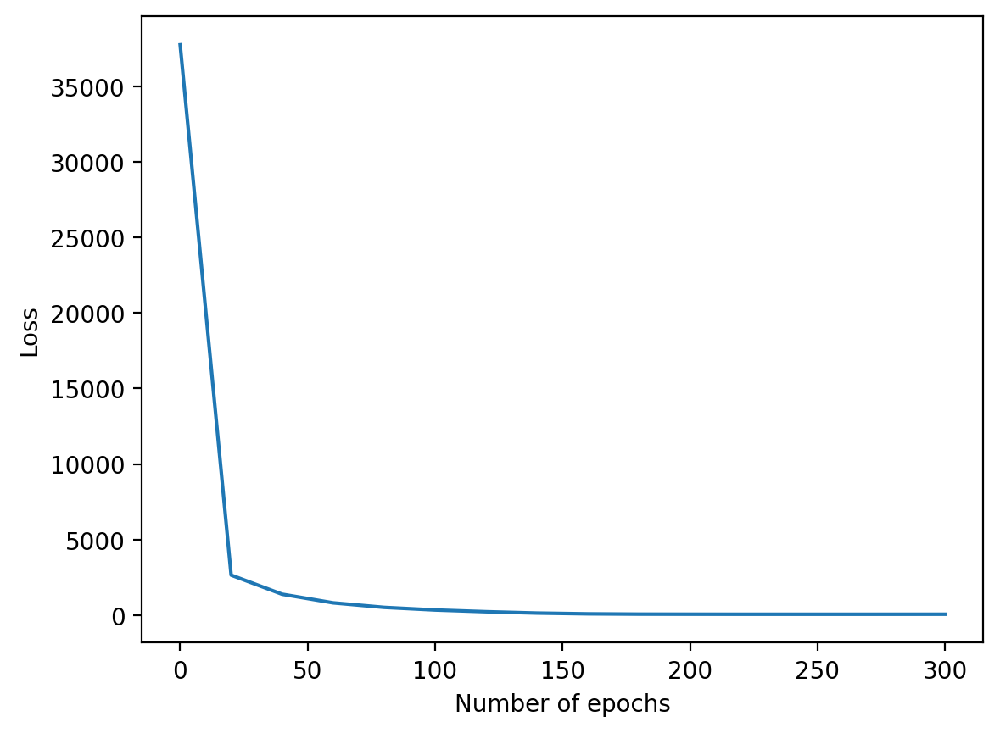

In [46]:
no_features = []
rmse_l = []
psnr_l = []
loss = []
for i in range(0, 301, 20):
    a, b, c= factorize(masked_img_patch[0], i)
    rmse_l.append(a)
    psnr_l.append(b)
    loss.append(c)
    no_features.append(i)

plt.plot(no_features, rmse_l)
plt.xlabel("Number of epochs")
plt.ylabel("Root Mean Squared Error")
plt.show()
plt.plot(no_features, psnr_l)
plt.xlabel("Number of epochs")
plt.ylabel("Peak Signal to Noise Ratio")
plt.show()
plt.plot(no_features, loss)
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.show()

In [47]:
# Mask the image with NaN values randomly 
def mask_image(img, prop):
    img_copy = img.clone()
    mask = torch.rand(img.shape) < prop
    img_copy[mask] = float('nan') # aij where maskij is true nan is substituted
    return img_copy, mask

masked_img = mask_image(crop, 0.01) # exactly 900 pixels can't be removed
masked_img[1].sum()

tensor(866)

Loss: 37666.78125
Number of epochs 1
Number of Features: 0
Root Mean Squared Error: 126.1649398803711
Peak Signal to Noise Ratio: 6.112029552459717


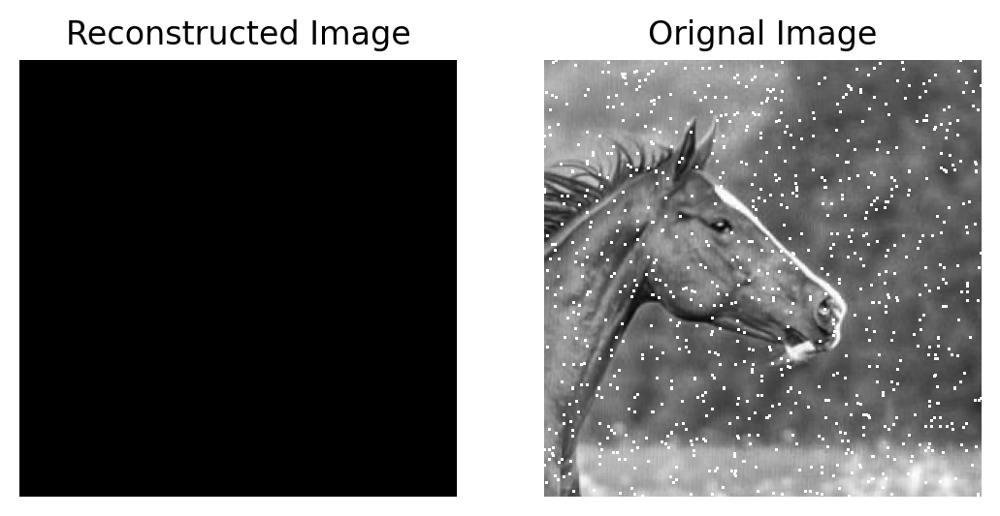

Loss: 2657.332763671875
Number of epochs 2663
Number of Features: 20
Root Mean Squared Error: 8.90069580078125
Peak Signal to Noise Ratio: 29.142324447631836


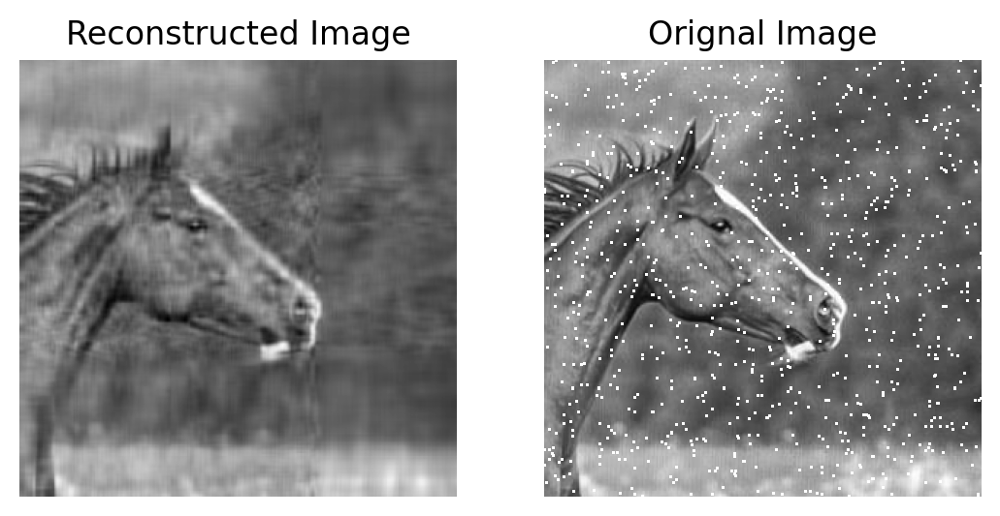

Loss: 1408.593017578125
Number of epochs 2693
Number of Features: 40
Root Mean Squared Error: 4.718061923980713
Peak Signal to Noise Ratio: 34.6555290222168


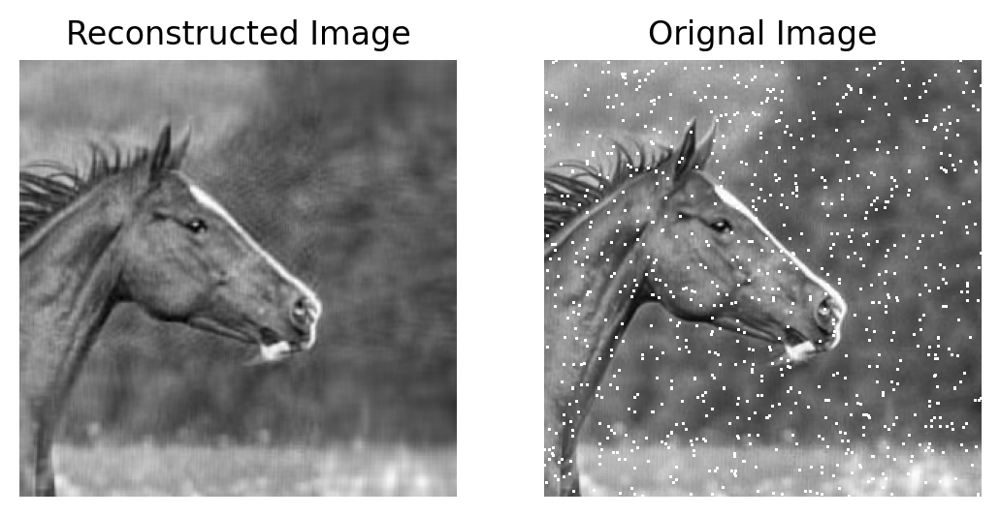

Loss: 832.3687133789062
Number of epochs 2601
Number of Features: 60
Root Mean Squared Error: 2.78800630569458
Peak Signal to Noise Ratio: 39.22492980957031


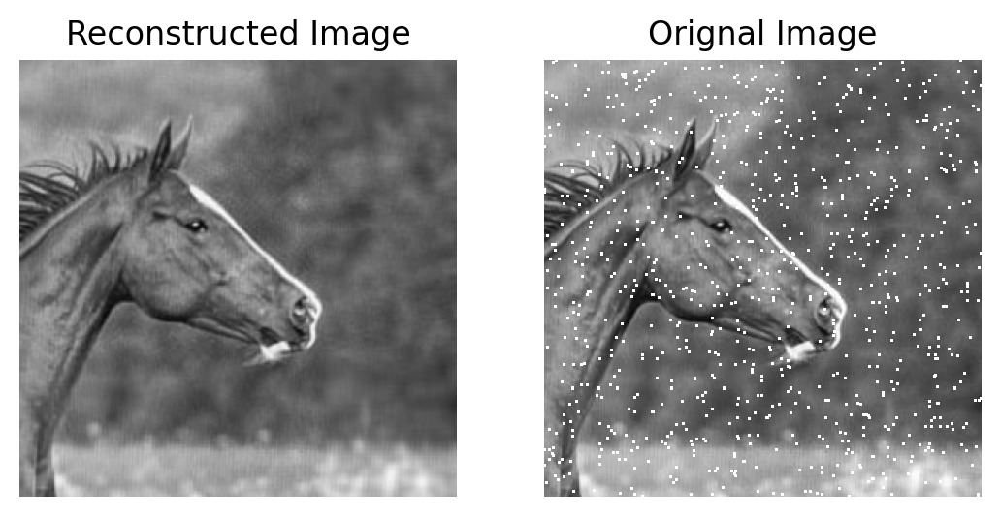

Loss: 531.2901611328125
Number of epochs 2851
Number of Features: 80
Root Mean Squared Error: 1.7795478105545044
Peak Signal to Noise Ratio: 43.124610900878906


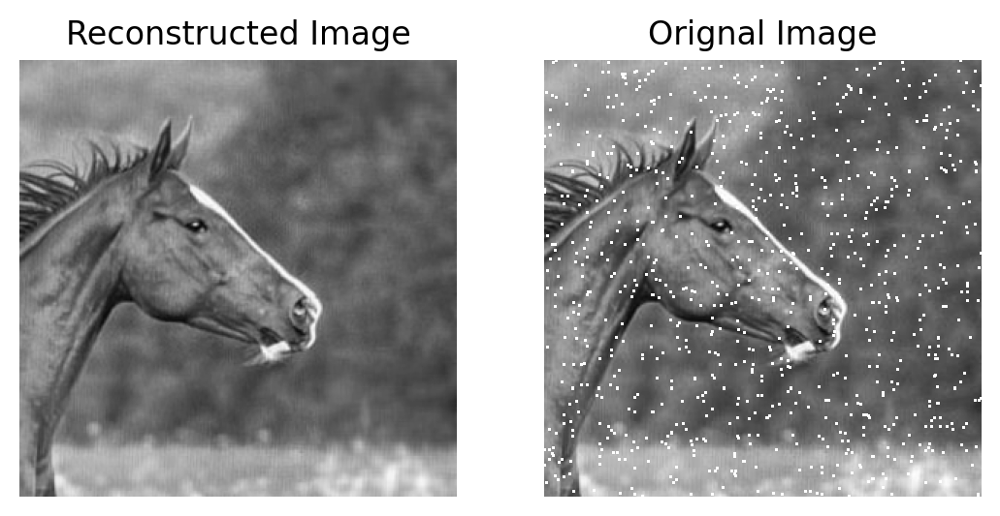

Loss: 355.0889892578125
Number of epochs 2237
Number of Features: 100
Root Mean Squared Error: 1.1893657445907593
Peak Signal to Noise Ratio: 46.62449264526367


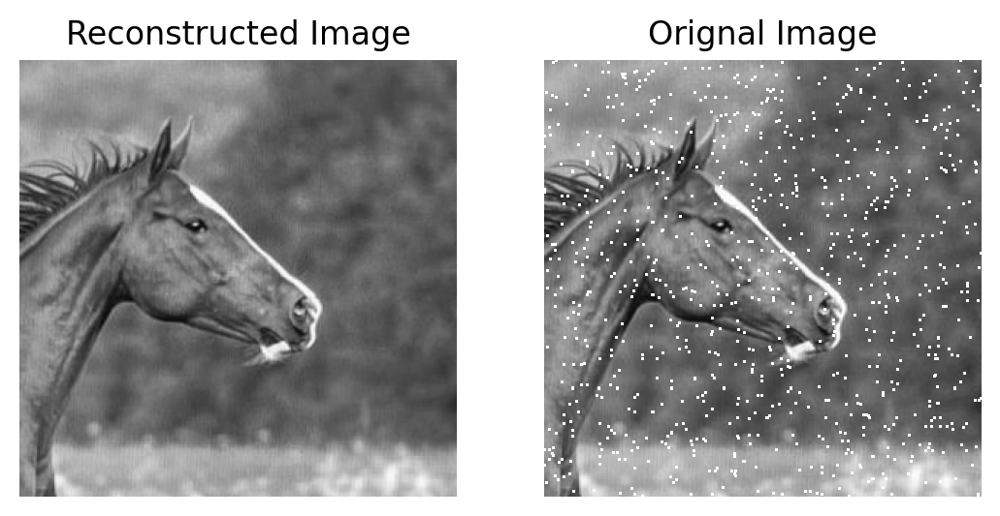

Loss: 234.01235961914062
Number of epochs 2049
Number of Features: 120
Root Mean Squared Error: 0.783860445022583
Peak Signal to Noise Ratio: 50.246028900146484


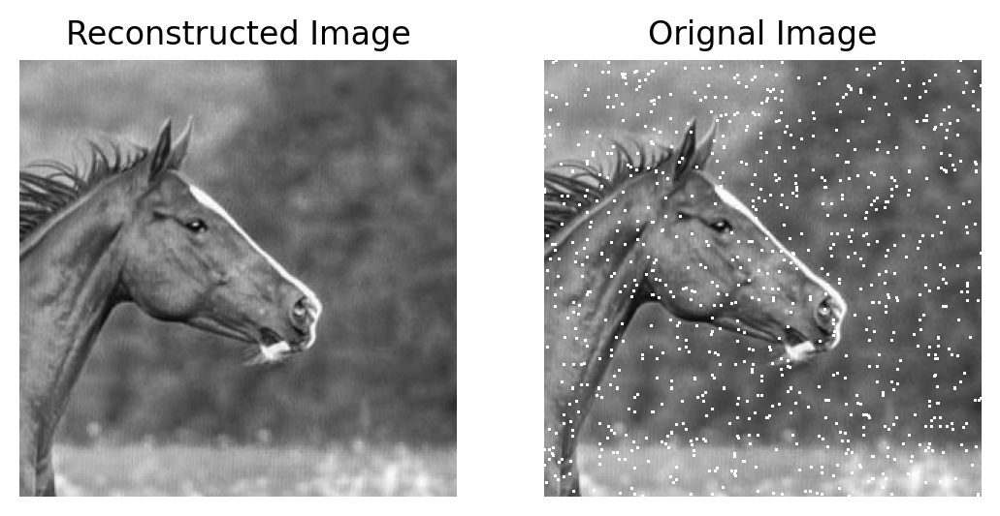

Loss: 149.21595764160156
Number of epochs 2714
Number of Features: 140
Root Mean Squared Error: 0.4997851848602295
Peak Signal to Noise Ratio: 54.15513610839844


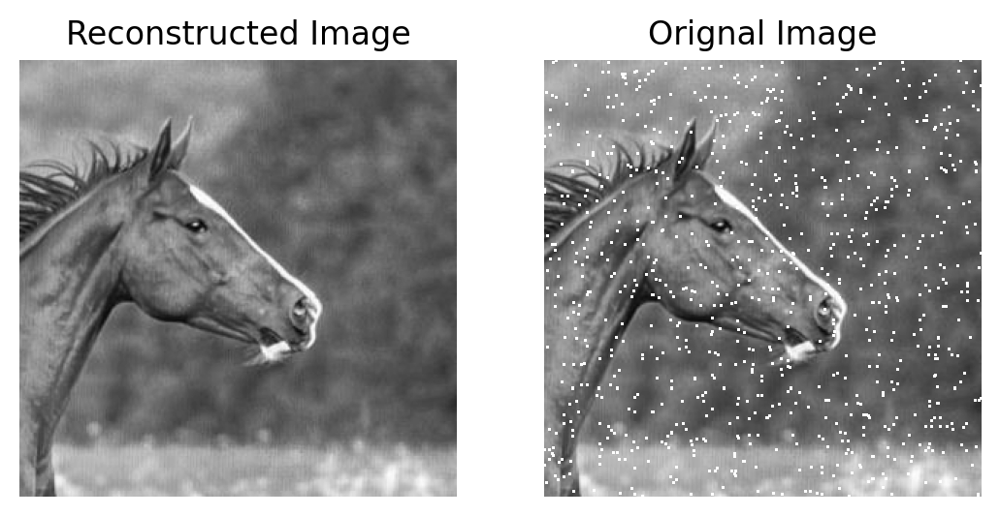

Loss: 93.72676086425781
Number of epochs 3346
Number of Features: 160
Root Mean Squared Error: 0.31391164660453796
Peak Signal to Noise Ratio: 58.19465637207031


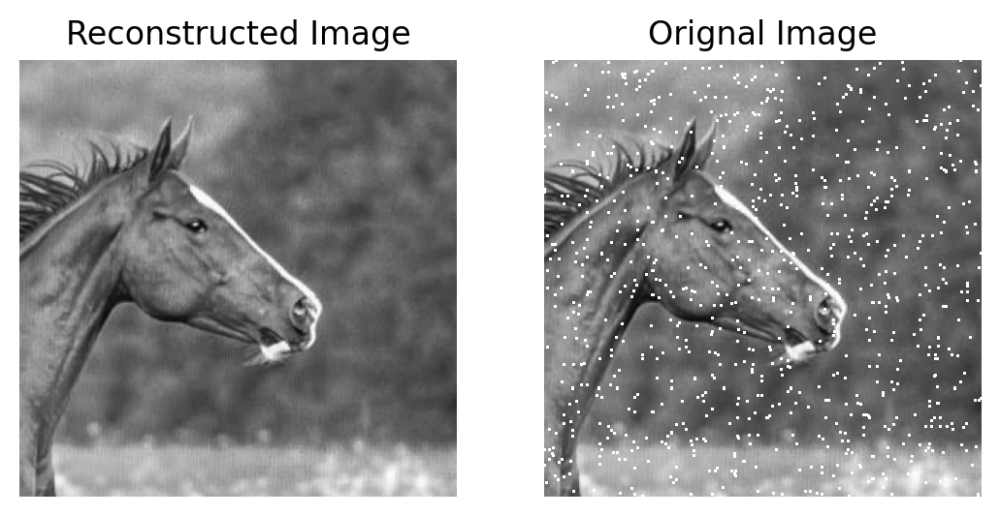

Loss: 71.92044830322266
Number of epochs 3065
Number of Features: 180
Root Mean Squared Error: 0.2408488243818283
Peak Signal to Noise Ratio: 60.49591064453125


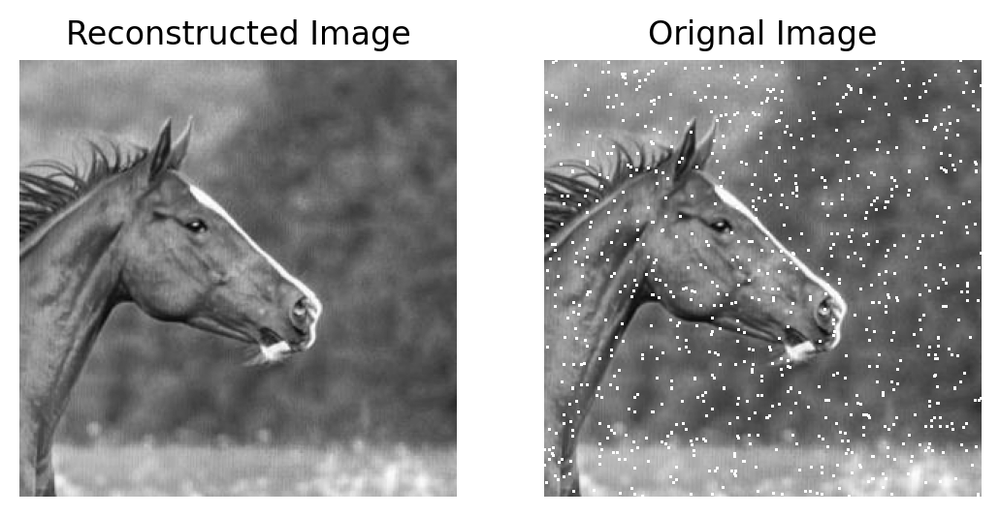

Loss: 66.1318588256836
Number of epochs 2327
Number of Features: 200
Root Mean Squared Error: 0.22143305838108063
Peak Signal to Noise Ratio: 61.2259521484375


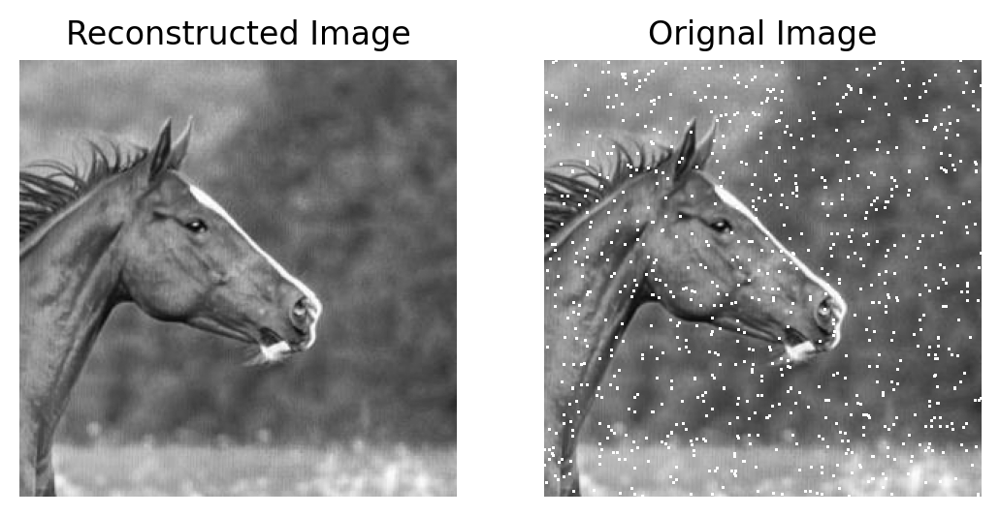

Loss: 64.40982818603516
Number of epochs 1897
Number of Features: 220
Root Mean Squared Error: 0.21563394367694855
Peak Signal to Noise Ratio: 61.456459045410156


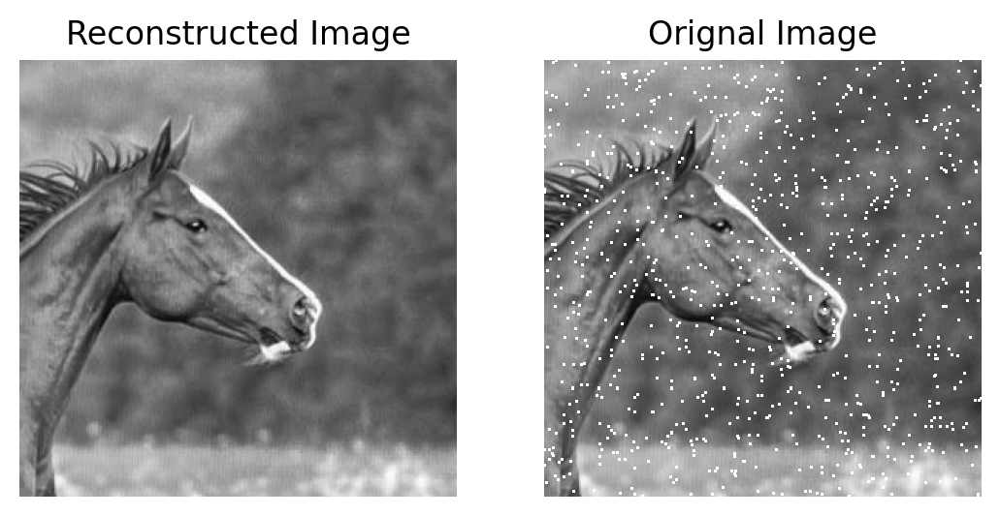

Loss: 63.010379791259766
Number of epochs 1480
Number of Features: 240
Root Mean Squared Error: 0.2108996957540512
Peak Signal to Noise Ratio: 61.64928436279297


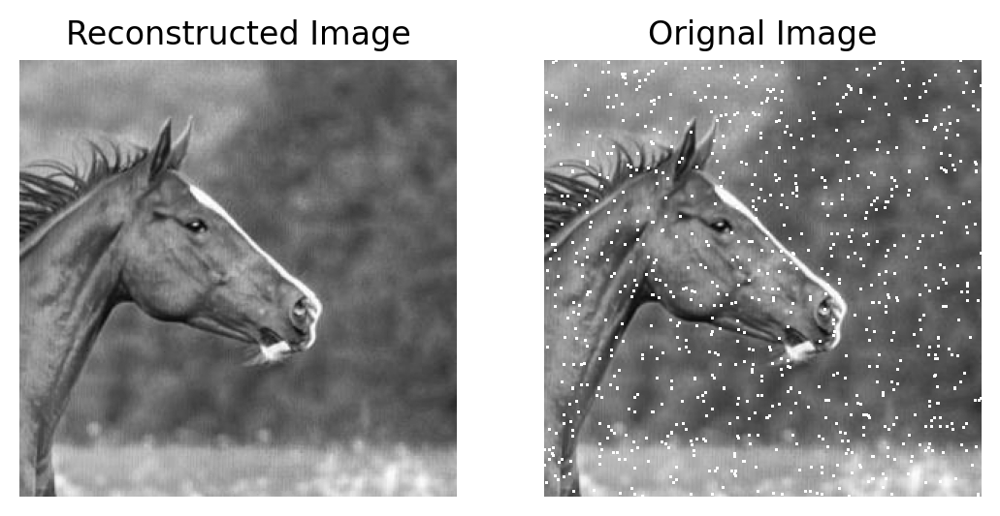

Loss: 63.438934326171875
Number of epochs 1240
Number of Features: 260
Root Mean Squared Error: 0.21229155361652374
Peak Signal to Noise Ratio: 61.59214782714844


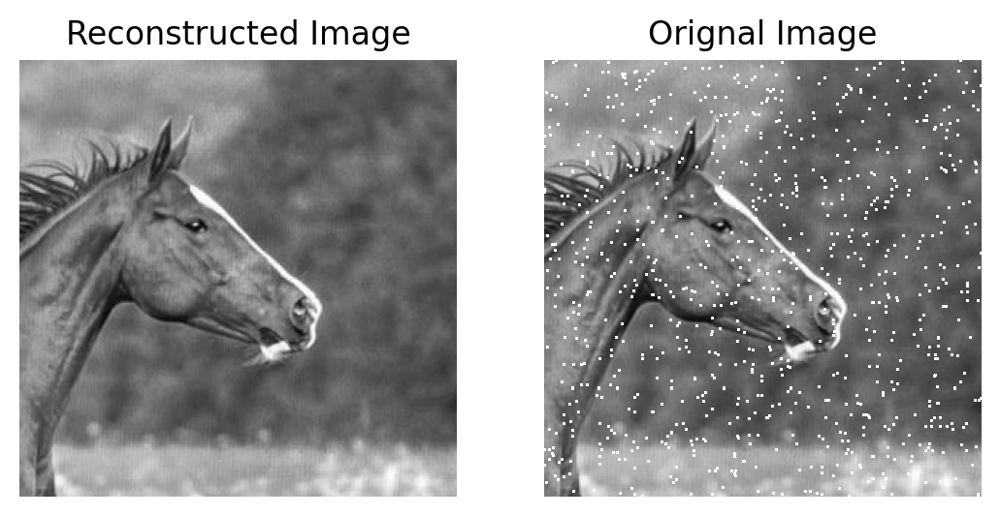

Loss: 63.78633499145508
Number of epochs 1043
Number of Features: 280
Root Mean Squared Error: 0.21338006854057312
Peak Signal to Noise Ratio: 61.5477294921875


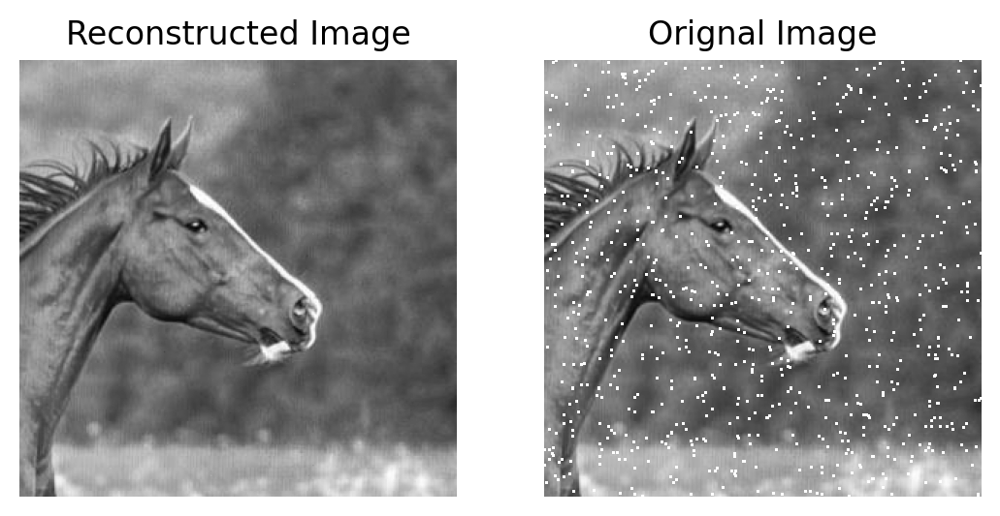

Loss: 33.546531677246094
Number of epochs 5001
Number of Features: 300
Root Mean Squared Error: 0.1128564327955246
Peak Signal to Noise Ratio: 67.08027648925781


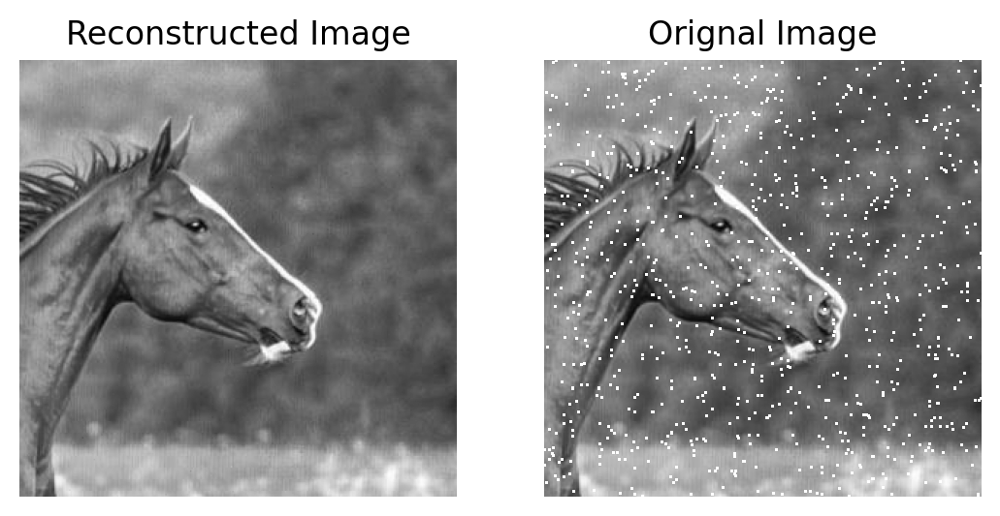

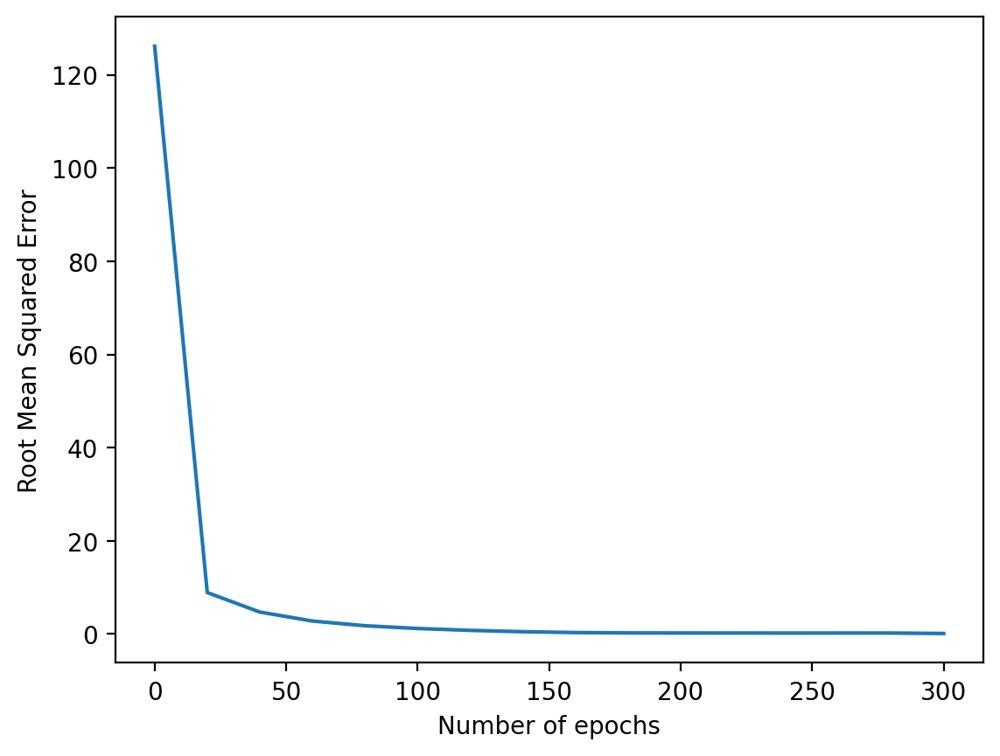

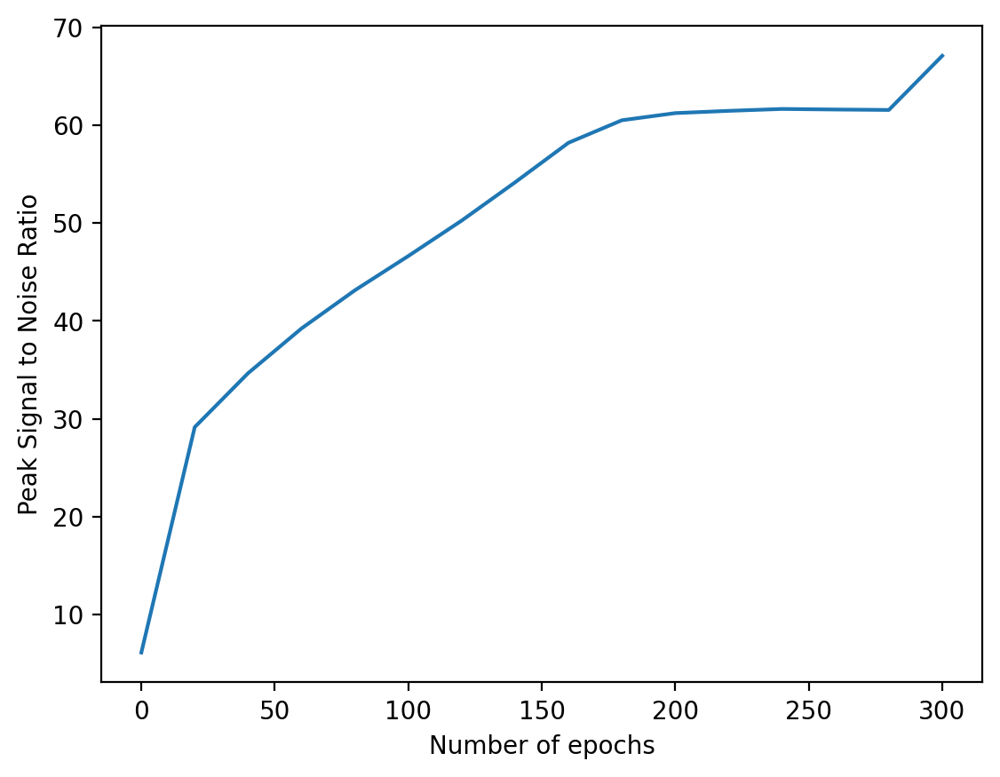

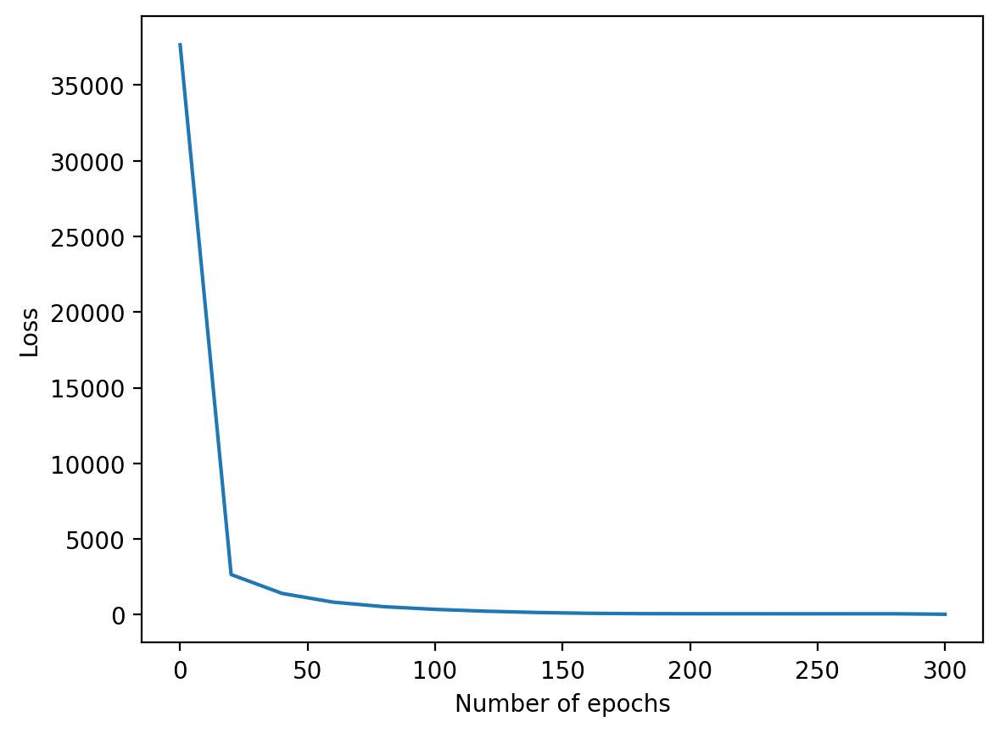

In [48]:
no_features = []
rmse_l = []
psnr_l = []
loss = []
for i in range(0, 301, 20):
    a, b, c= factorize(masked_img[0], i)
    rmse_l.append(a)
    psnr_l.append(b)
    loss.append(c)
    no_features.append(i)

plt.plot(no_features, rmse_l)
plt.xlabel("Number of epochs")
plt.ylabel("Root Mean Squared Error")
plt.show()
plt.plot(no_features, psnr_l)
plt.xlabel("Number of epochs")
plt.ylabel("Peak Signal to Noise Ratio")
plt.show()
plt.plot(no_features, loss)
plt.xlabel("Number of epochs")
plt.ylabel("Loss")
plt.show()

#### Task 5 : Image Compression using Matrix Factorisation [3 Marks]

In [49]:
patch = torchvision.transforms.functional.crop(img, 210, 1050, 50, 50)
patch.shape

torch.Size([50, 50])

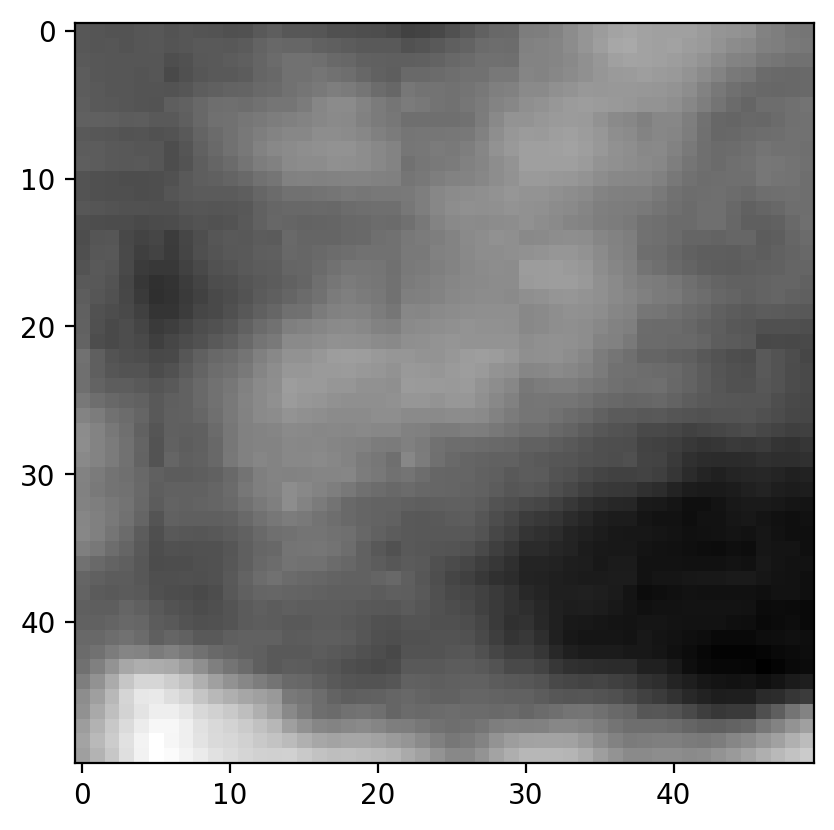

In [50]:
plt.imshow(patch, cmap='gray')

Loss: 106.46607971191406
Number of epochs 1789
Number of Features: 5
Root Mean Squared Error: 2.129319190979004
Peak Signal to Noise Ratio: 41.56599044799805


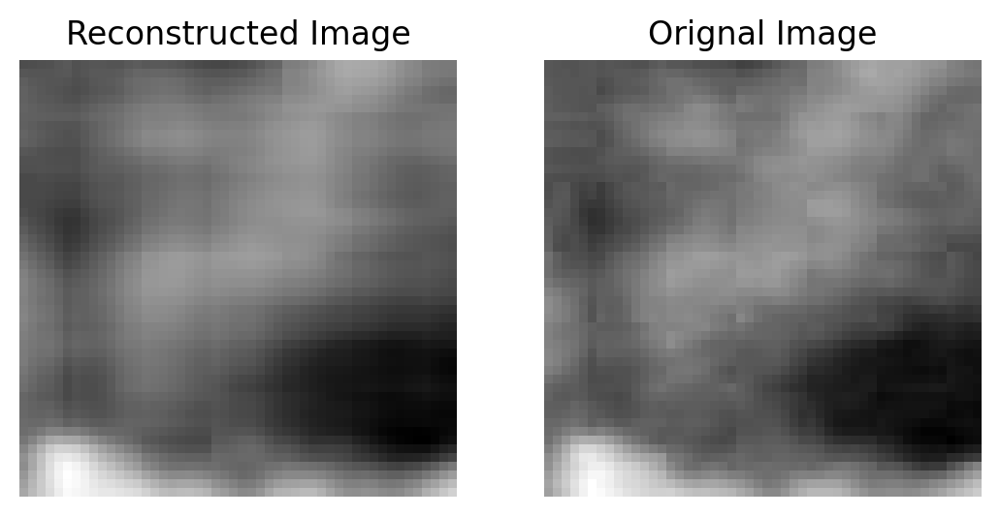

Loss: 44.84708023071289
Number of epochs 2649
Number of Features: 10
Root Mean Squared Error: 0.8969395160675049
Peak Signal to Noise Ratio: 49.07554244995117


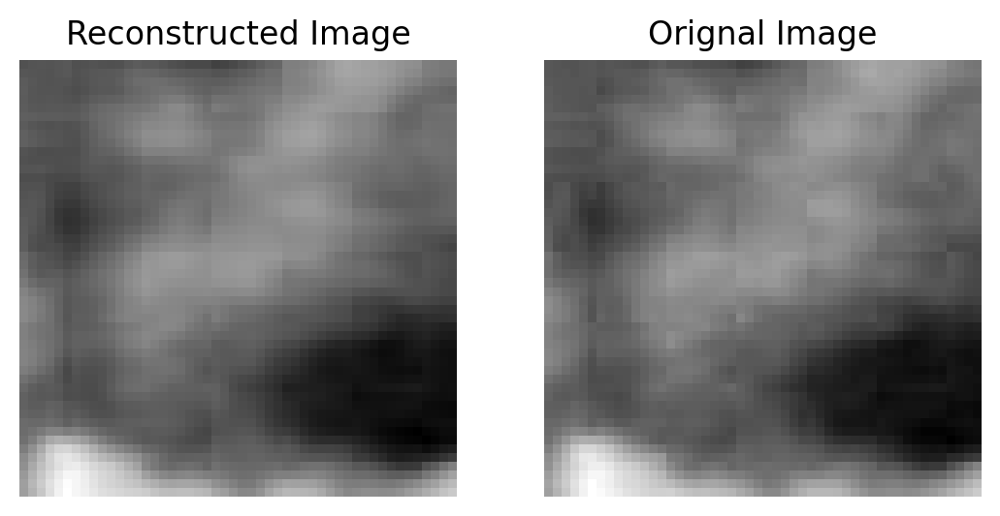

Loss: 10.785155296325684
Number of epochs 1385
Number of Features: 25
Root Mean Squared Error: 0.2157231867313385
Peak Signal to Noise Ratio: 61.45286560058594


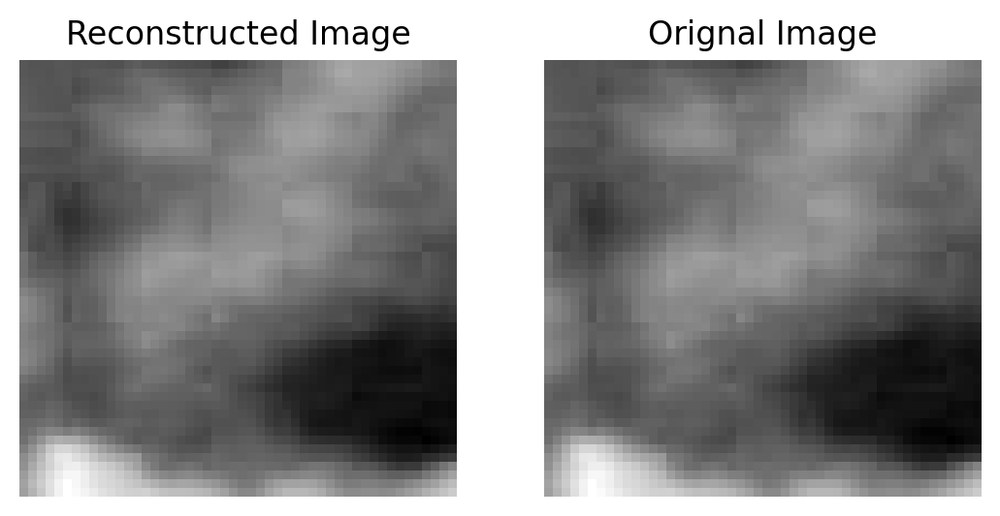

Loss: 5.9309468269348145
Number of epochs 663
Number of Features: 50
Root Mean Squared Error: 0.1186312586069107
Peak Signal to Noise Ratio: 66.64682006835938


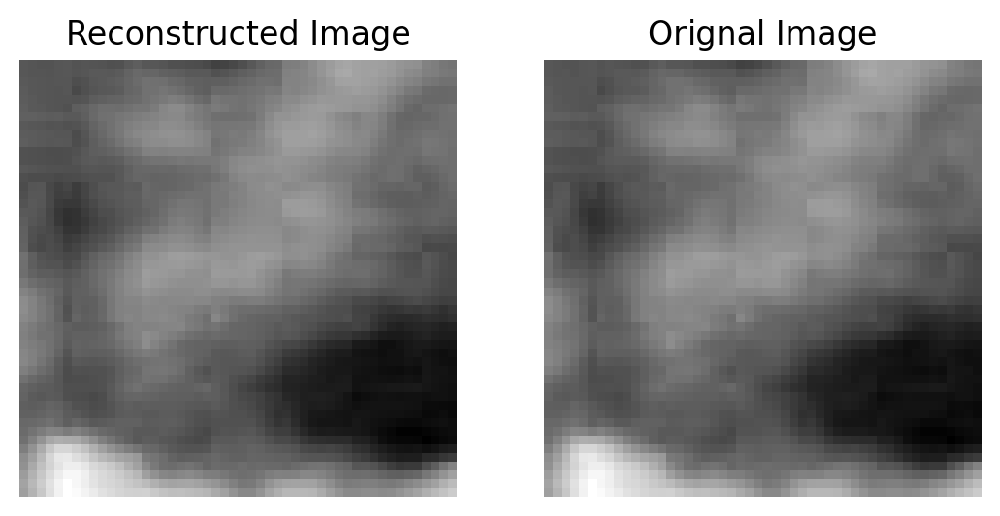

In [51]:
for i in [5, 10, 25, 50]:
    factorize(patch, i)